# settings

In [1]:
import sys
sys.path.append('../../')

from datetime import date, timedelta
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
import numpy as np

%matplotlib inline
%config InlineBackend.figure_formats = {'png', 'retina'}
from scripts.simulator import VariableLocalTransaction
# from scripts.variable_local import AutoAdjustmentTransactionMulti
from scripts.exec_simulator import ExecuteAutoAdjustmentTransactionSingle, ExecuteAutoAdjustmentTransactionMulti
from scripts.price_data.get_price import GetPriceData
from scripts.visualizer import LogVisualizer
from scripts.types import PortfolioItem, PortfolioWithPriorityItem, TransactionOption

price_getter = GetPriceData()

from pprint import pprint

In [2]:
# Relative path to save data
from pathlib import Path

data_dir = Path('./data0118/')
data_dir.mkdir(parents=True, exist_ok=True)

# portfolio

## Borrower portfolio

In [3]:
# a
borrower_portfolio_a = {
    'JPY': {
        'num': 50000000,
        'is_usd': False,
        'priority': 10,
    },
    '8306.T': {
        'num': 2000000,
        'is_usd': False,
        'priority': 1,
    },
    '8604.T': {
        'num': 100000,
        'is_usd': False,
        'priority': 0,
    }
}

# 担保急落シナリオ
borrower_portfolio_down = {
    '8306.T': {
        'num': 1000000,
        'is_usd': False,
        'priority': 5,
    },
    '8604.T': {
        'num': 1000000,
        'is_usd': False,
        'priority': 4,
    },
    '4901.T': {
        'num': 1000000,
        'is_usd': False,
        'priority': 3,
    },
    '7013.T': {
        'num': 1000000,
        'is_usd': False,
        'priority': 2,
    },
    '8031.T': {
        'num': 1000000,
        'is_usd': False,
        'priority': 1,
    },
}

'^TNX'


'^TNX'

In [4]:
912 * 3000000 + 490 * 3000000

4206000000

## Lender portfolio

In [35]:
# NVIDIA
lender_portfolio_a = {
    'NVDA': {
        'num': 50000,
        'is_usd': True
    },
    'AAPL': {
        'num': 50000,
        'is_usd': True
    },
}

# 担保急落シナリオ
lender_portfolio_jpy_0 = {
    'JPY': {
        'num': 8616500000,
        'is_usd': False,
        'priority': 1,
    }
}

lender_portfolio_jpy_2 = {
    'JPY': {
        'num': 7595250000,
        'is_usd': False,
        'priority': 1,
    }
}

lender_portfolio_jpy_3 = {
    'JPY': {
        'num': 4106850000,
        'is_usd': False,
        'priority': 1,
    }
}

lender_portfolio_jpy_4 = {
    'JPY': {
        'num': 5699050000,
        'is_usd': False,
        'priority': 1,
    }
}

lender_portfolio_jpy_1 = {
    'JPY': {
        'num': 6983450000,
        'is_usd': False,
        'priority': 1,
    }
}


# models (options)

## model0
現行手続きモデル

In [6]:
options_0: TransactionOption = {
    'borrower_loan_ratio': 0.95,
    'print_log': True,
    'auto_deposit': True,
    'is_dummy_data': False,
    'is_reverse': False,
    'is_manual': True,
}

## model1
ベースモデル（単一トークン価格調整、マージンコール閾値設定なし）

In [7]:
options_1: TransactionOption = {
    'borrower_loan_ratio': 0.95,
    'print_log': True,
    'auto_deposit': True,
    'is_dummy_data': False,
    'is_reverse': False,
}

## model2
ベースモデル（複数トークン価格調整、マージンコール閾値設定なし）

In [8]:
options_2 = {
    'borrower_loan_ratio': 0.95,
    'print_log': True,
    'auto_deposit': True,
    'is_dummy_data': False,
    'is_reverse': False,
}

## model3
ベースモデル（単一トークン価格調整、マージンコール閾値設定あり）

In [9]:
options_3 = {
    'borrower_loan_ratio': 0.95,
    'print_log': True,
    'auto_deposit': True,
    'is_dummy_data': False,
    'is_reverse': False,
    'margin_call_threshold': 0.02
}

## model4
ベースモデル（複数トークン価格調整、マージンコール閾値設定あり）

In [10]:
options_4 = {
    'borrower_loan_ratio': 0.95,
    'print_log': True,
    'auto_deposit': True,
    'is_dummy_data': False,
    'is_reverse': False,
    'margin_call_threshold': 0.02
}

In [33]:
824+1423+3050+1880+1893
923+1405+2715+1600+1352
485+569+1904+1020+984
509+678+2300+1110+852 
423+434+1771+810+885 # 3

602+810+3120+1690+1129 # 1

627+927+2310+1210+925 # 4

824+1423+3050+1880+1893 #0

9070

In [34]:
9070*0.95

8616.5

In [13]:
698345000 * 0.02

13966900.0

# Simulation

## リーマンショック前後（2008/9 - 2009/9）

In [31]:
start_date_0 = date(2008, 9, 1)
end_date_0 = date(2009, 9, 1)

In [36]:
simulator_0 = ExecuteAutoAdjustmentTransactionSingle(borrower_portfolio_down, lender_portfolio_jpy_0, start_date_0, end_date_0,  options=options_0)
print('Start simulation model0...')
%time logs_0 = simulator_0.execute()
print("End simulation model0!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 8616500000, 'is_usd': False, 'priority': 1}}"
2008-09-01: Price updating...
JPY: 1.0
2008-09-01: Price updating...
8306.T: 824.0
8604.T: 1423.0
4901.T: 3050.0
7013.T: 1880.0
8031.T: 1893.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 824.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 1423.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 3050.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1880.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 1893.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@

2008-09-06: Price updating...
JPY: 1.0
2008-09-06: Price updating...
8306.T: 850.0
8604.T: 1501.0
4901.T: 3080.0
7013.T: 1840.0
8031.T: 1699.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 3080.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1840.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1699.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1117647, 'price': 850.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1501.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-09-07
2008-09-07: Price updating...
JPY: 1.0
2008-09-07: Price updating...
8306.T: 850.0
8604.T: 1501.0
4901.T:

from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2895.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1650.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1429.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2263889, 'price': 792.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1303.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-09-16
2008-09-16: Price updating...
JPY: 1.0
2008-09-16: Price updating...
8306.T: 792.0
8604.T: 1303.0
4901.T: 2895.0
7013.T: 1650.0
8031.T: 1429.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'490

2008-09-25: Price updating...
JPY: 1.0
2008-09-25: Price updating...
8306.T: 917.0
8604.T: 1461.0
4901.T: 2985.0
7013.T: 1720.0
8031.T: 1498.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2985.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1720.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1498.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1533261, 'price': 917.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1461.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-09-26
2008-09-26: Price updating...
JPY: 1.0
2008-09-26: Price updating...
8306.T: 931.0
8604.T: 1468.0
4901.T:

from Borrower(A) to Lender(B)
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1380.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1114.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3703474, 'price': 806.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1241.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-05
2008-10-05: Price updating...
JPY: 1.0
2008-10-05: Price updating...
8306.T: 806.0
8604.T: 1241.0
4901.T: 2350.0
7013.T: 1380.0
8031.T: 1114.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False

2008-10-14: Price updating...
JPY: 1.0
2008-10-14: Price updating...
8306.T: 810.0
8604.T: 1425.0
4901.T: 2210.0
7013.T: 1370.0
8031.T: 1240.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2210.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1370.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1240.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3487655, 'price': 810.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1425.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-15
2008-10-15: Price updating...
JPY: 1.0
2008-10-15: Price updating...
8306.T: 821.0
8604.T: 1413.0
4901.T:

from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1190.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 940.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4900672, 'price': 745.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1179.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-24
2008-10-24: Price updating...
JPY: 1.0
2008-10-24: Price updating...
8306.T: 683.0
8604.T: 1055.0
4901.T: 1983.0
7013.T: 1070.0
8031.T: 859.0
adjust by single token manually.
from Borrower(A) to Lender(B)
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 

2008-11-02: Price updating...
JPY: 1.0
2008-11-02: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2310.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1210.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 925.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5897927, 'price': 627.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 927.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-03
2008-11-03: Price updating...
JPY: 1.0
2008-11-03: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310

from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2300.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1310.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 973.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5603476, 'price': 633.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 940.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-12
2008-11-12: Price updating...
JPY: 1.0
2008-11-12: Price updating...
8306.T: 615.0
8604.T: 905.0
4901.T: 2310.0
7013.T: 1280.0
8031.T: 928.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T'

2008-11-21: Price updating...
JPY: 1.0
2008-11-21: Price updating...
8306.T: 492.0
8604.T: 645.0
4901.T: 2110.0
7013.T: 1140.0
8031.T: 753.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1140.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 753.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 8987804, 'price': 492.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 645.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-22
2008-11-22: Price updating...
JPY: 1.0
2008-11-22: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 2280

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2300.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1110.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 852.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 8113948, 'price': 509.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 678.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-01
2008-12-01: Price updating...
JPY: 1.0
2008-12-01: Price updating...
8306.T: 509.0
8604.T: 678.0
4901.T: 2300.0
7013.T: 1110.0
8031.T: 852.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T'

2008-12-10: Price updating...
JPY: 1.0
2008-12-10: Price updating...
8306.T: 468.0
8604.T: 701.0
4901.T: 2175.0
7013.T: 1110.0
8031.T: 796.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2175.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1110.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 796.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 9162393, 'price': 468.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 701.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-11
2008-12-11: Price updating...
JPY: 1.0
2008-12-11: Price updating...
8306.T: 500.0
8604.T: 718.0
4901.T: 2145

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1855.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1090.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 820.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 8225000, 'price': 560.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 699.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-20
2008-12-20: Price updating...
JPY: 1.0
2008-12-20: Price updating...
8306.T: 576.0
8604.T: 752.0
4901.T: 1914.0
7013.T: 1100.0
8031.T: 824.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T'

2008-12-29: Price updating...
JPY: 1.0
2008-12-29: Price updating...
8306.T: 556.0
8604.T: 734.0
4901.T: 1927.0
7013.T: 1100.0
8031.T: 875.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1927.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1100.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 875.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 7974820, 'price': 556.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 734.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-30
2008-12-30: Price updating...
JPY: 1.0
2008-12-30: Price updating...
8306.T: 549.0
8604.T: 729.0
4901.T: 1950

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2260.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1270.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1052.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 6380136, 'price': 584.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 762.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-01-08
2009-01-08: Price updating...
JPY: 1.0
2009-01-08: Price updating...
8306.T: 560.0
8604.T: 712.0
4901.T: 2200.0
7013.T: 1220.0
8031.T: 992.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T

2009-01-17: Price updating...
JPY: 1.0
2009-01-17: Price updating...
8306.T: 517.0
8604.T: 653.0
4901.T: 2125.0
7013.T: 1110.0
8031.T: 922.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2125.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1110.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 922.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 8239846, 'price': 517.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 653.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-01-18
2009-01-18: Price updating...
JPY: 1.0
2009-01-18: Price updating...
8306.T: 517.0
8604.T: 653.0
4901.T: 2125

from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1915.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1060.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 886.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 10043669, 'price': 458.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 609.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-01-27
2009-01-27: Price updating...
JPY: 1.0
2009-01-27: Price updating...
8306.T: 497.0
8604.T: 639.0
4901.T: 2045.0
7013.T: 1100.0
8031.T: 942.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T

2009-02-05: Price updating...
JPY: 1.0
2009-02-05: Price updating...
8306.T: 477.0
8604.T: 573.0
4901.T: 1885.0
7013.T: 970.0
8031.T: 1045.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1885.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 970.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1045.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 9637317, 'price': 477.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 573.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-02-06
2009-02-06: Price updating...
JPY: 1.0
2009-02-06: Price updating...
8306.T: 480.0
8604.T: 572.0
4901.T: 1935

2009-02-15: Price updating...
JPY: 1.0
2009-02-15: Price updating...
8306.T: 470.0
8604.T: 470.0
4901.T: 1836.0
7013.T: 930.0
8031.T: 950.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1836.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 930.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 950.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 10391489, 'price': 470.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 470.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-02-16
2009-02-16: Price updating...
JPY: 1.0
2009-02-16: Price updating...
8306.T: 470.0
8604.T: 470.0
4901.T: 1836.

2009-02-25: Price updating...
JPY: 1.0
2009-02-25: Price updating...
8306.T: 445.0
8604.T: 415.0
4901.T: 1833.0
7013.T: 850.0
8031.T: 887.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1833.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 850.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 887.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 11426966, 'price': 445.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 415.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-02-26
2009-02-26: Price updating...
JPY: 1.0
2009-02-26: Price updating...
8306.T: 442.0
8604.T: 415.0
4901.T: 1842.

2009-03-07: Price updating...
8306.T: 381.0
8604.T: 414.0
4901.T: 1765.0
7013.T: 840.0
8031.T: 837.0
adjust by single token manually.
from Borrower(A) to Lender(B)
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1765.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 840.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 837.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 13685040, 'price': 381.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 414.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-08
2009-03-08: Price updating...
JPY: 1.0
2009-03-08: Price updating...
8306.T: 381.0
8604.T: 414.0
4901.T: 1765.0
7013.T: 840.0
8031.T: 837.0
adjust by single token manually

2009-03-17: Price updating...
JPY: 1.0
2009-03-17: Price updating...
8306.T: 477.0
8604.T: 507.0
4901.T: 2005.0
7013.T: 960.0
8031.T: 866.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2005.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 960.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 866.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 9920335, 'price': 477.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 507.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-18
2009-03-18: Price updating...
JPY: 1.0
2009-03-18: Price updating...
8306.T: 478.0
8604.T: 514.0
4901.T: 2055.0

2009-03-27: Price updating...
JPY: 1.0
2009-03-27: Price updating...
8306.T: 527.0
8604.T: 551.0
4901.T: 2350.0
7013.T: 1130.0
8031.T: 1049.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1130.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1049.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 7571158, 'price': 527.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 551.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-28
2009-03-28: Price updating...
JPY: 1.0
2009-03-28: Price updating...
8306.T: 488.0
8604.T: 524.0
4901.T: 21

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2390.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1270.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1141.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 7181286, 'price': 513.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 585.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-06
2009-04-06: Price updating...
JPY: 1.0
2009-04-06: Price updating...
8306.T: 513.0
8604.T: 585.0
4901.T: 2390.0
7013.T: 1270.0
8031.T: 1141.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-04-15: Price updating...
JPY: 1.0
2009-04-15: Price updating...
8306.T: 521.0
8604.T: 597.0
4901.T: 2475.0
7013.T: 1290.0
8031.T: 1179.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2475.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1290.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1179.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 6773513, 'price': 521.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 597.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-16
2009-04-16: Price updating...
JPY: 1.0
2009-04-16: Price updating...
8306.T: 505.0
8604.T: 582.0
4901.T: 25

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2525.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1530.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1070.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 6761133, 'price': 494.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 605.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-25
2009-04-25: Price updating...
JPY: 1.0
2009-04-25: Price updating...
8306.T: 508.0
8604.T: 609.0
4901.T: 2585.0
7013.T: 1500.0
8031.T: 1066.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-05-04: Price updating...
JPY: 1.0
2009-05-04: Price updating...
8306.T: 617.0
8604.T: 652.0
4901.T: 2605.0
7013.T: 1680.0
8031.T: 1159.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2605.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1680.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1159.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4820097, 'price': 617.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 652.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-05-05
2009-05-05: Price updating...
JPY: 1.0
2009-05-05: Price updating...
8306.T: 617.0
8604.T: 652.0
4901.T: 26

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2660.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1600.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1179.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4724800, 'price': 625.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 678.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-05-14
2009-05-14: Price updating...
JPY: 1.0
2009-05-14: Price updating...
8306.T: 588.0
8604.T: 645.0
4901.T: 2580.0
7013.T: 1520.0
8031.T: 1117.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-05-23: Price updating...
JPY: 1.0
2009-05-23: Price updating...
8306.T: 611.0
8604.T: 689.0
4901.T: 2555.0
7013.T: 1680.0
8031.T: 1177.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2555.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1680.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1177.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4859247, 'price': 611.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 689.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-05-24
2009-05-24: Price updating...
JPY: 1.0
2009-05-24: Price updating...
8306.T: 611.0
8604.T: 689.0
4901.T: 25

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2740.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1720.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1286.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4191558, 'price': 616.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 742.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-06-02
2009-06-02: Price updating...
JPY: 1.0
2009-06-02: Price updating...
8306.T: 621.0
8604.T: 737.0
4901.T: 2790.0
7013.T: 1710.0
8031.T: 1281.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-06-11: Price updating...
JPY: 1.0
2009-06-11: Price updating...
8306.T: 641.0
8604.T: 872.0
4901.T: 2910.0
7013.T: 1730.0
8031.T: 1301.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2910.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1730.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1301.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3521060, 'price': 641.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 872.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-06-12
2009-06-12: Price updating...
JPY: 1.0
2009-06-12: Price updating...
8306.T: 652.0
8604.T: 917.0
4901.T: 29

from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2860.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1710.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1164.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4087805, 'price': 615.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 822.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-06-21
2009-06-21: Price updating...
JPY: 1.0
2009-06-21: Price updating...
8306.T: 615.0
8604.T: 822.0
4901.T: 2860.0
7013.T: 1710.0
8031.T: 1164.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-06-30: Price updating...
JPY: 1.0
2009-06-30: Price updating...
8306.T: 598.0
8604.T: 814.0
4901.T: 3060.0
7013.T: 1670.0
8031.T: 1146.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 3060.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1670.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1146.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3979933, 'price': 598.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 814.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-01
2009-07-01: Price updating...
JPY: 1.0
2009-07-01: Price updating...
8306.T: 602.0
8604.T: 810.0
4901.T: 31

from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2915.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1420.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1056.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5395265, 'price': 549.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 717.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-10
2009-07-10: Price updating...
JPY: 1.0
2009-07-10: Price updating...
8306.T: 538.0
8604.T: 710.0
4901.T: 2945.0
7013.T: 1420.0
8031.T: 1049.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-07-19: Price updating...
JPY: 1.0
2009-07-19: Price updating...
8306.T: 556.0
8604.T: 770.0
4901.T: 2885.0
7013.T: 1600.0
8031.T: 1147.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2885.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1600.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1147.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4798562, 'price': 556.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 770.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-20
2009-07-20: Price updating...
JPY: 1.0
2009-07-20: Price updating...
8306.T: 556.0
8604.T: 770.0
4901.T: 28

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 3000.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1630.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1171.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4421621, 'price': 555.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 815.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-29
2009-07-29: Price updating...
JPY: 1.0
2009-07-29: Price updating...
8306.T: 544.0
8604.T: 809.0
4901.T: 3020.0
7013.T: 1590.0
8031.T: 1171.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-08-07: Price updating...
JPY: 1.0
2009-08-07: Price updating...
8306.T: 598.0
8604.T: 786.0
4901.T: 2885.0
7013.T: 1650.0
8031.T: 1303.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2885.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1650.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1303.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4090302, 'price': 598.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 786.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-08
2009-08-08: Price updating...
JPY: 1.0
2009-08-08: Price updating...
8306.T: 609.0
8604.T: 808.0
4901.T: 28

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2690.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1740.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1241.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4367174, 'price': 591.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 818.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-17
2009-08-17: Price updating...
JPY: 1.0
2009-08-17: Price updating...
8306.T: 591.0
8604.T: 818.0
4901.T: 2690.0
7013.T: 1740.0
8031.T: 1241.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-08-26: Price updating...
JPY: 1.0
2009-08-26: Price updating...
8306.T: 595.0
8604.T: 824.0
4901.T: 2840.0
7013.T: 1870.0
8031.T: 1261.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2840.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1870.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1261.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3823529, 'price': 595.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 824.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-27
2009-08-27: Price updating...
JPY: 1.0
2009-08-27: Price updating...
8306.T: 593.0
8604.T: 813.0
4901.T: 27

Log Visualizer initialized.


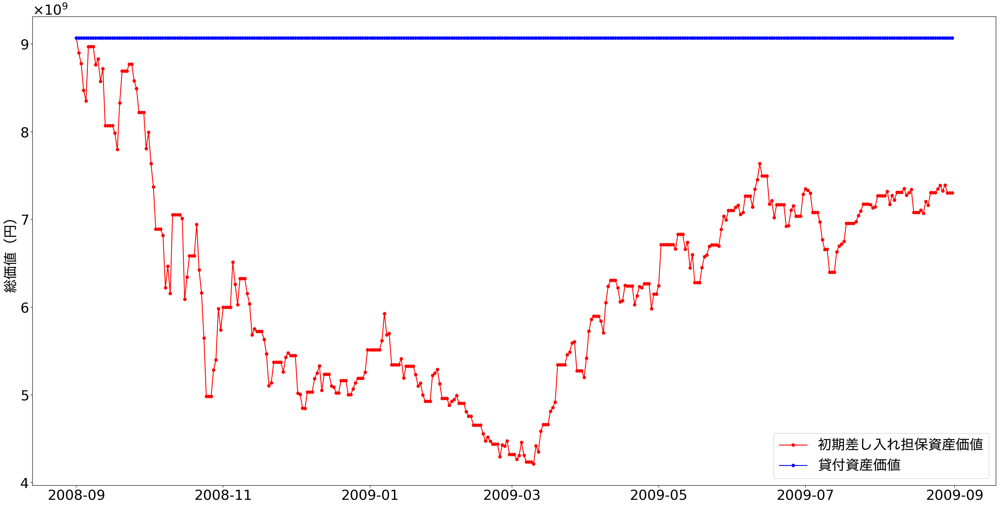

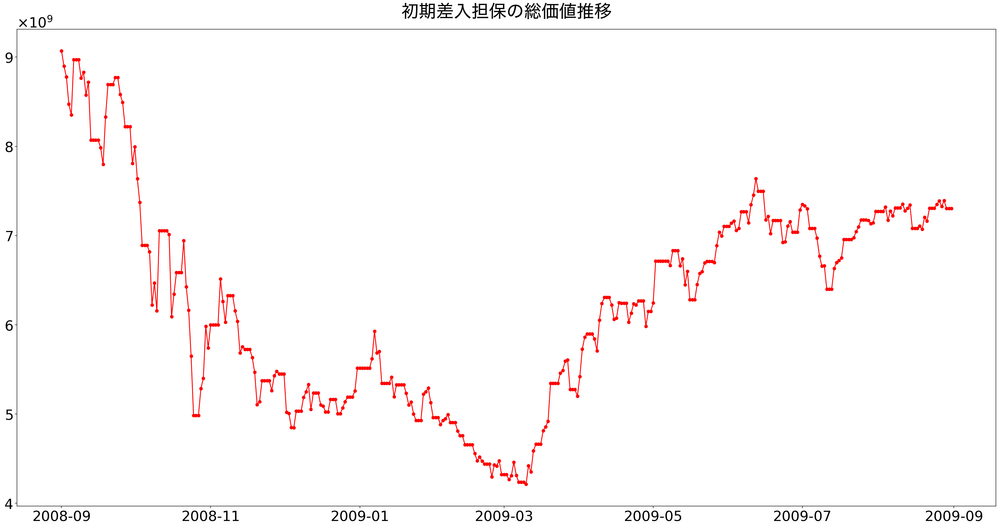

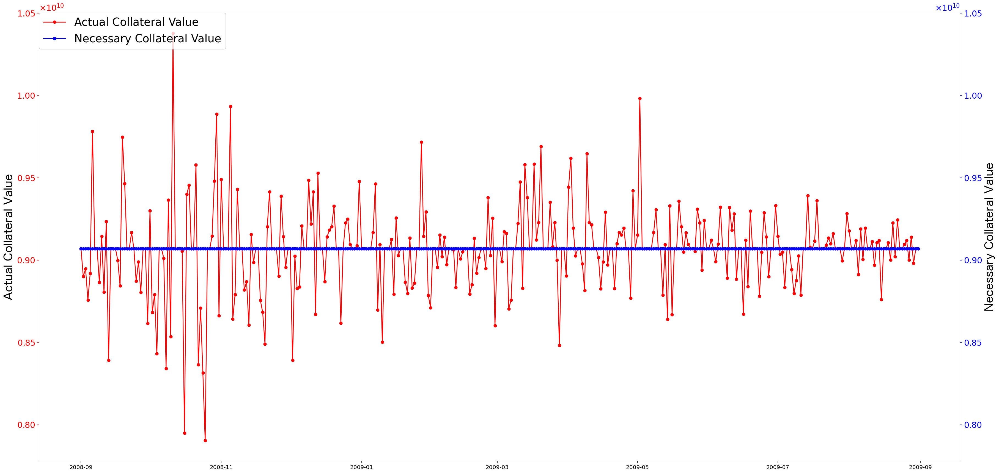

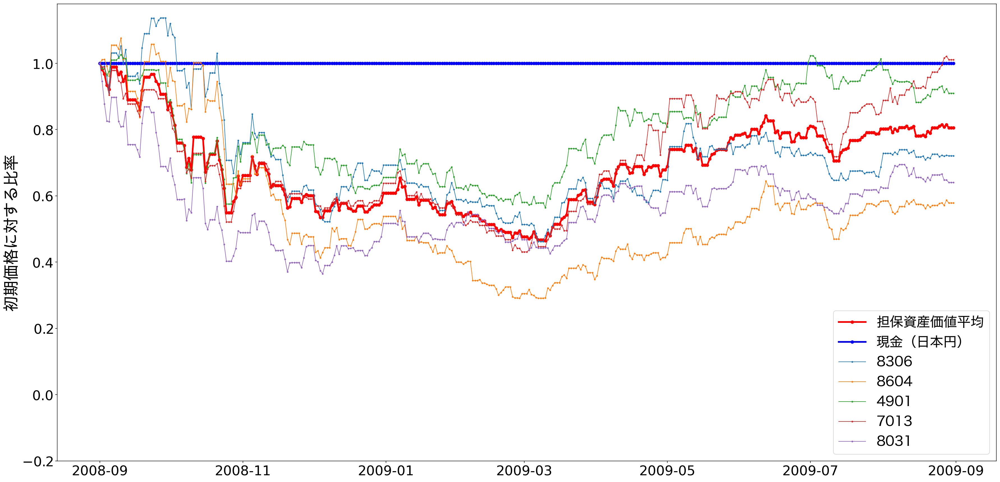

In [37]:
data_dir = Path('./data0118/')
data_dir.mkdir(parents=True, exist_ok=True)
visualizer_0 = LogVisualizer(logs_0, './data0118/all_term')
visualizer_0.compare_initial_collateral_portfolio()
visualizer_0.plt_initial_collateral_portfolio_value()
visualizer_0.plt_collateral_price_diff()
visualizer_0.compare_initial_collateral_portfolio_ratio()

Log Visualizer initialized.


AttributeError: 'LogVisualizer' object has no attribute 'calc_price_diffs'

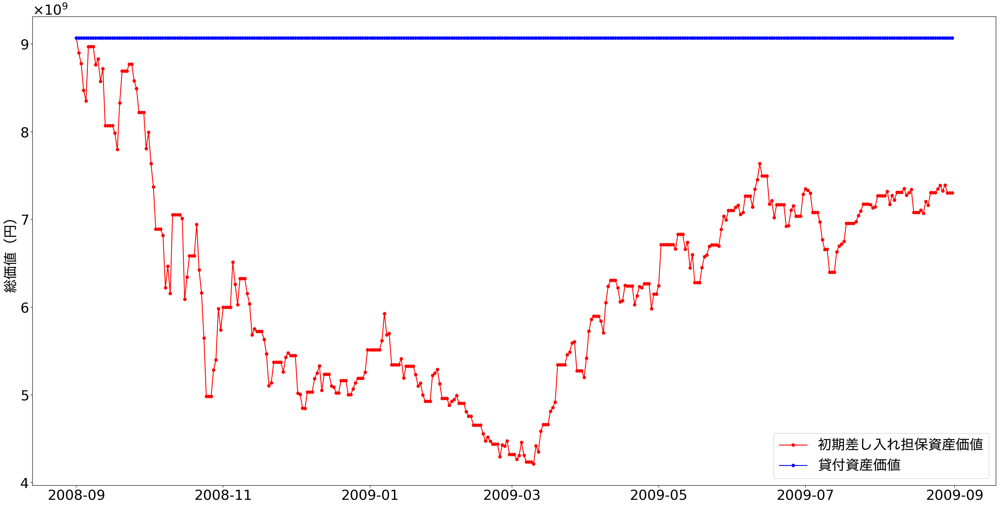

In [38]:
saved_logs_all_term = np.load('./data/all_term.npy', allow_pickle=True).item()
visualizer_all_term = LogVisualizer(saved_logs_all_term)
visualizer_all_term.compare_initial_collateral_portfolio()
visualizer_all_term.calc_price_diffs()
collateral_values_all_term = visualizer_all_term.calc_collateral_num()

## 【注意】simulation_v0 からの変更

- シナリオ番号の変更
    - **シナリオ1: 平常**
    - **シナリオ2: 急落**
    - **シナリオ3: 急騰**
    - **シナリオ4: 乱高下**
- シミュレーション期間の変更
    - **シナリオ1: 2009/7-2009/9**
    - シナリオ2: 2008/10-2008/12(stay)
    - シナリオ3: 2009/3-2009/5(stay)
    - **シナリオ4: 2008/11-2009/1**

## シナリオ1: 平常

In [13]:
# シミュレーションの日付設定
start_date_1 = date(2009, 7, 1)
end_date_1 = date(2009, 8, 31)

### model0
現行手続きモデル

In [65]:
simulator_s1_m0 = ExecuteAutoAdjustmentTransactionSingle(borrower_portfolio_down, lender_portfolio_jpy_1, start_date_1, end_date_1,  options=options_0)
print('Start simulation model0...')
%time logs_s1_m0 = simulator_s1_m0.execute()
print("End simulation model0!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 6983450000, 'is_usd': False, 'priority': 1}}"
2009-07-01: Price updating...
JPY: 1.0
2009-07-01: Price updating...
8306.T: 602.0
8604.T: 810.0
4901.T: 3120.0
7013.T: 1690.0
8031.T: 1129.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 602.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 810.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 3120.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1690.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 1129.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2

2009-07-09: Price updating...
JPY: 1.0
2009-07-09: Price updating...
8306.T: 549.0
8604.T: 717.0
4901.T: 2915.0
7013.T: 1420.0
8031.T: 1056.0
adjust by single token manually.
from Borrower(A) to Lender(B)
!!!!additional token issuing by Borrower(A)!!!!
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-10
2009-07-10: Price updating...
JPY: 1.0
2009-07-10: Price updating...
8306.T: 538.0
8604.T: 710.0
4901.T: 2945.0
7013.T: 1420.0
8031.T: 1049.0
adjust by single token manually.
from Borrower(A) to Lender(B)
!!!!additional token issuing by Borrower(A)!!!!
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-11
2009-07-11: Price updating...
JPY:

2009-07-26: Price updating...
JPY: 1.0
2009-07-26: Price updating...
8306.T: 553.0
8604.T: 820.0
4901.T: 2985.0
7013.T: 1650.0
8031.T: 1169.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-27
2009-07-27: Price updating...
JPY: 1.0
2009-07-27: Price updating...
8306.T: 553.0
8604.T: 820.0
4901.T: 2985.0
7013.T: 1650.0
8031.T: 1169.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2

8031.T: 1298.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-12
2009-08-12: Price updating...
JPY: 1.0
2009-08-12: Price updating...
8306.T: 600.0
8604.T: 819.0
4901.T: 2880.0
7013.T: 1730.0
8031.T: 1250.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-13
2009-08-13: Price updating...
JPY: 1.0
2009-08-13: Price updating...
8306.T: 603.0
8604.T: 828.0
4901.T: 2865.0
7013.

2009-08-28: Price updating...
JPY: 1.0
2009-08-28: Price updating...
8306.T: 595.0
8604.T: 835.0
4901.T: 2815.0
7013.T: 1920.0
8031.T: 1226.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-29
2009-08-29: Price updating...
JPY: 1.0
2009-08-29: Price updating...
8306.T: 594.0
8604.T: 823.0
4901.T: 2775.0
7013.T: 1900.0
8031.T: 1212.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2

In [47]:
visualizer_s1_m0 = LogVisualizer(logs_s1_m0, './data0118/s1_m0')
visualizer_s1_m0.compare_initial_collateral_portfolio_ratio()
visualizer_s1_m0.plt_initial_collateral_portfolio_value()
visualizer_s1_m0.bar_collateral_price_diff()
_ = visualizer_s1_m0.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

NameError: name 'logs_s1_m0' is not defined

### model1
ベースモデル（単一トークン価格調整、マージンコール閾値設定なし）

In [67]:
simulator_s1_m1 = ExecuteAutoAdjustmentTransactionSingle(borrower_portfolio_down, lender_portfolio_jpy_1, start_date_1, end_date_1,  options=options_1)
print('Start simulation model1...')
%time logs_s1_m1 = simulator_s1_m1.execute()
print("End simulation model1!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 6983450000, 'is_usd': False, 'priority': 1}}"
2009-07-01: Price updating...
JPY: 1.0
2009-07-01: Price updating...
8306.T: 602.0
8604.T: 810.0
4901.T: 3120.0
7013.T: 1690.0
8031.T: 1129.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 602.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 810.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 3120.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1690.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 1129.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2

2009-07-06: Price updating...
JPY: 1.0
2009-07-06: Price updating...
8306.T: 595.0
8604.T: 822.0
4901.T: 3030.0
7013.T: 1550.0
8031.T: 1083.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 3030.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1550.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1083.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1455463, 'price': 595.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 822.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-07
2009-07-07: Price updating...
JPY: 1.0
2009-07-07: Price updating...
8306.T: 589.0
8604.T: 793.0
4901.T: 301

4901.T: 2925.0
7013.T: 1480.0
8031.T: 1048.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2925.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1480.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1048.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2213754, 'price': 538.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 707.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-16
2009-07-16: Price updating...
JPY: 1.0
2009-07-16: Price updating...
8306.T: 533.0
8604.T: 714.0
4901.T: 2890.0
7013.T: 1490.0
8031.T: 1093.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@

--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2940.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1640.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1171.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1463636, 'price': 550.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 795.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-25
2009-07-25: Price updating...
JPY: 1.0
2009-07-25: Price updating...
8306.T: 553.0
8604.T: 820.0
4901.T: 2985.0
7013.T: 1650.0
8031.T: 1169.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 100

2009-08-03: Price updating...
JPY: 1.0
2009-08-03: Price updating...
8306.T: 600.0
8604.T: 832.0
4901.T: 2990.0
7013.T: 1670.0
8031.T: 1180.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2990.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1670.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1180.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1131666, 'price': 600.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 832.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-04
2009-08-04: Price updating...
JPY: 1.0
2009-08-04: Price updating...
8306.T: 600.0
8604.T: 814.0
4901.T: 292

--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2880.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1730.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1250.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1120000, 'price': 600.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 819.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-13
2009-08-13: Price updating...
JPY: 1.0
2009-08-13: Price updating...
8306.T: 603.0
8604.T: 828.0
4901.T: 2865.0
7013.T: 1750.0
8031.T: 1260.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 100

2009-08-22: Price updating...
JPY: 1.0
2009-08-22: Price updating...
8306.T: 598.0
8604.T: 813.0
4901.T: 2810.0
7013.T: 1830.0
8031.T: 1255.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2810.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1830.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1255.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1075250, 'price': 598.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 813.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-23
2009-08-23: Price updating...
JPY: 1.0
2009-08-23: Price updating...
8306.T: 598.0
8604.T: 813.0
4901.T: 281

Log Visualizer initialized.


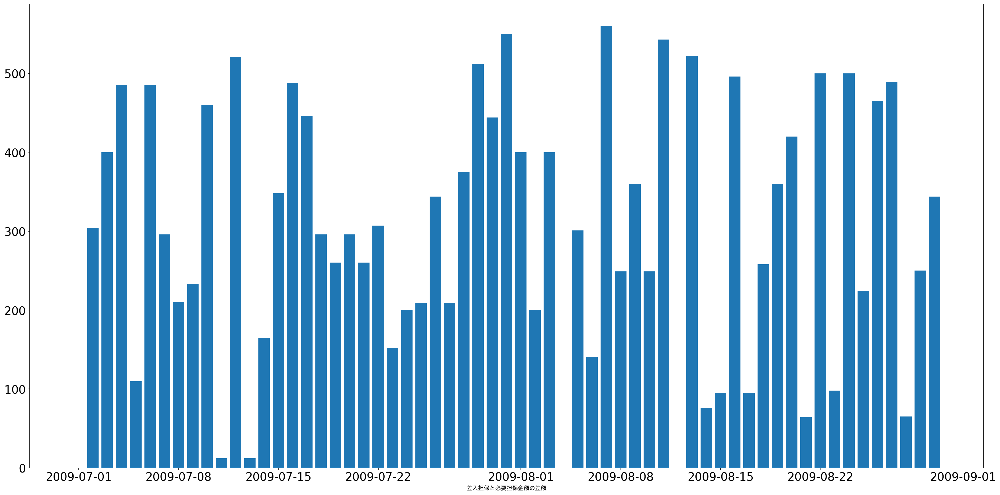

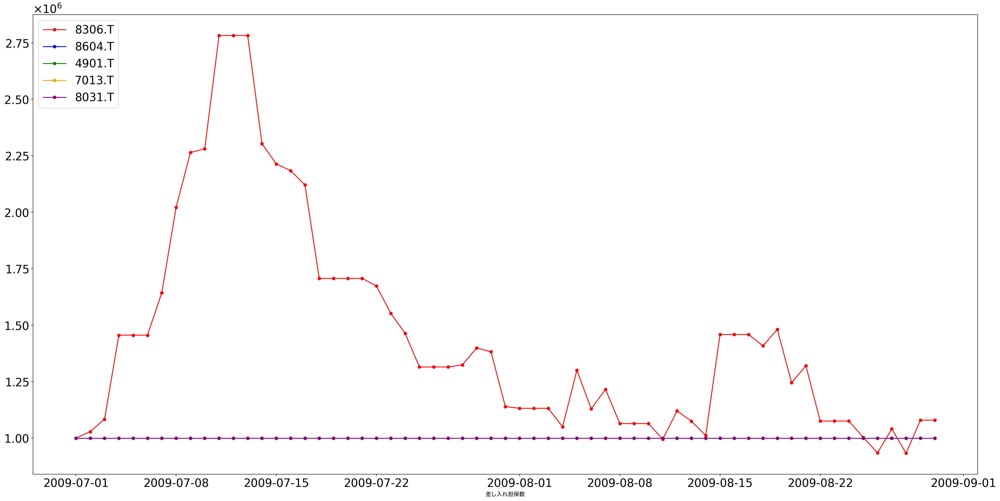

In [68]:
visualizer_s1_m1 = LogVisualizer(logs_s1_m1, './data0118/s1_m1')
# visualizer_s1_m0.compare_initial_collateral_portfolio()
# visualizer_s1_m0.plt_initial_collateral_portfolio_value()
visualizer_s1_m1.bar_collateral_price_diff()
_ = visualizer_s1_m1.plt_collateral_num(ymin=0, ymax=7.0e+6)

### model2
ベースモデル（複数トークン価格調整、マージンコール閾値設定なし）

In [69]:
simulator_s1_m2 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_down, lender_portfolio_jpy_1, start_date_1, end_date_1,  options=options_2)
print('Start simulation model2...')
%time logs_s1_m2 = simulator_s1_m2.execute()
print("End simulation model2!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 6983450000, 'is_usd': False, 'priority': 1}}"
2009-07-01: Price updating...
JPY: 1.0
2009-07-01: Price updating...
8306.T: 602.0
8604.T: 810.0
4901.T: 3120.0
7013.T: 1690.0
8031.T: 1129.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 602.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 810.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 3120.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1690.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 1129.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2

2009-07-05: Price updating...
JPY: 1.0
2009-07-05: Price updating...
8306.T: 595.0
8604.T: 822.0
4901.T: 3030.0
7013.T: 1550.0
8031.T: 1083.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 1000000, 'is_usd': False, 'price': 1083.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 3030.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1550.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 999999, 'price': 1083.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1455463, 'price': 595.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 822.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-06
2009-07-06: Price updating...
JPY: 1.0
2009-07-06: Price updating...
8306.T: 595.0
8604.T: 822.0
4901

{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2815.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1350.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 999999, 'price': 1035.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2782364, 'price': 533.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 668.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-13
2009-07-13: Price updating...
JPY: 1.0
2009-07-13: Price updating...
8306.T: 533.0
8604.T: 668.0
4901.T: 2815.0
7013.T: 1350.0
8031.T: 1035.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 533.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 668.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2815.0}"
"7013.T: {'num': 0, 'is_usd': False

2009-07-21: Price updating...
JPY: 1.0
2009-07-21: Price updating...
8306.T: 556.0
8604.T: 770.0
4901.T: 2885.0
7013.T: 1600.0
8031.T: 1147.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 556.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 770.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2885.0}"
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 1600.0}"
"8031.T: {'num': 521356, 'is_usd': False, 'priority': 1, 'price': 1147.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2885.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1600.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 478645, 'price': 1147.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2782364, 'price': 556.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 770.0, 'priority': 4}}
OK. collateral is move

{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 3020.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1590.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 357297, 'price': 1171.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2782364, 'price': 544.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 809.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-30
2009-07-30: Price updating...
JPY: 1.0
2009-07-30: Price updating...
8306.T: 542.0
8604.T: 818.0
4901.T: 3040.0
7013.T: 1590.0
8031.T: 1154.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 357297, 'is_usd': False, 'price': 1154.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 3040.0, 'priority': 3},
 '7013.T': {'is_usd': Fa

2009-08-07: Price updating...
JPY: 1.0
2009-08-07: Price updating...
8306.T: 598.0
8604.T: 786.0
4901.T: 2885.0
7013.T: 1650.0
8031.T: 1303.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 598.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 786.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2885.0}"
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 1650.0}"
"8031.T: {'num': 762054, 'is_usd': False, 'priority': 1, 'price': 1303.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2885.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1650.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 281003, 'price': 1303.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2782364, 'price': 598.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 786.0, 'priority': 4}}
OK. collateral is move

{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2690.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1740.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 369560, 'price': 1241.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2782364, 'price': 591.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 818.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-16
2009-08-16: Price updating...
JPY: 1.0
2009-08-16: Price updating...
8306.T: 591.0
8604.T: 818.0
4901.T: 2690.0
7013.T: 1740.0
8031.T: 1241.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 369560, 'is_usd': False, 'price': 1241.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2690.0, 'priority': 3},
 '7013.T': {'is_usd': Fa

{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2810.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1830.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 186571, 'price': 1255.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2782364, 'price': 598.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 813.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-24
2009-08-24: Price updating...
JPY: 1.0
2009-08-24: Price updating...
8306.T: 598.0
8604.T: 813.0
4901.T: 2810.0
7013.T: 1830.0
8031.T: 1255.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 186571, 'is_usd': False, 'price': 1255.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2810.0, 'priority': 3},
 '7013.T': {'is_usd': Fa

Log Visualizer initialized.


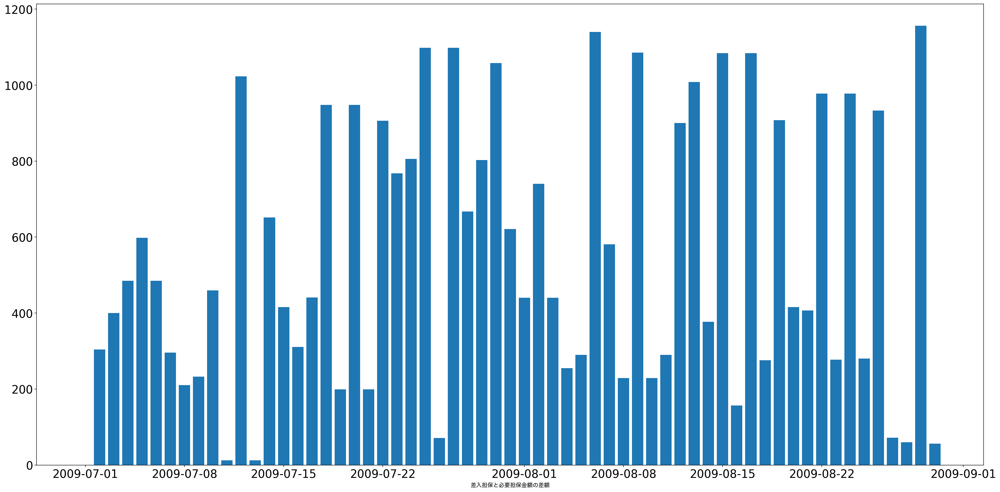

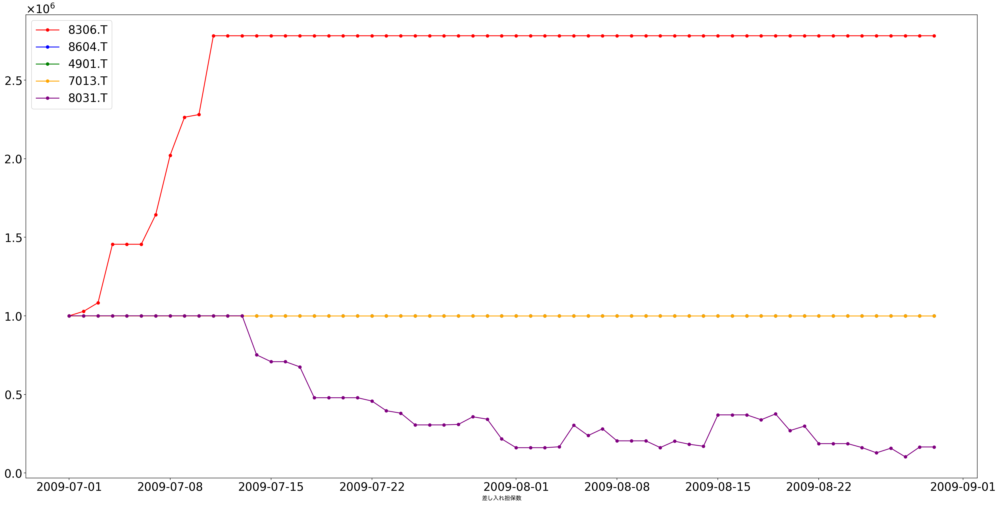

In [70]:
visualizer_s1_m2 = LogVisualizer(logs_s1_m2, './data0118/s1_m2')
# visualizer_s1_m0.plt_initial_collateral_portfolio_value()
visualizer_s1_m2.bar_collateral_price_diff()
_ = visualizer_s1_m2.plt_collateral_num(ymin=0, ymax=7.0e+6)

### model3
ベースモデル（単一トークン価格調整、マージンコール閾値設定あり）

In [14]:
simulator_s1_m3 = ExecuteAutoAdjustmentTransactionSingle(borrower_portfolio_down, lender_portfolio_jpy_1, start_date_1, end_date_1,  options=options_3)
print('Start simulation model3...')
%time logs_s1_m3 = simulator_s1_m3.execute()
print("End simulation model3!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 6983450000, 'is_usd': False, 'priority': 1}}"
2009-07-01: Price updating...
JPY: 1.0
2009-07-01: Price updating...
8306.T: 602.0
8604.T: 810.0
4901.T: 3120.0
7013.T: 1690.0
8031.T: 1129.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 602.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 810.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 3120.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1690.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 1129.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2

2009-07-06: Price updating...
JPY: 1.0
2009-07-06: Price updating...
8306.T: 595.0
8604.T: 822.0
4901.T: 3030.0
7013.T: 1550.0
8031.T: 1083.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  147020000.0
price_diff:  -485.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 3030.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1550.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1083.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1455463, 'price': 595.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 822.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-07
2009-07-07: Price updating...
JPY: 1.0
2009-07-07: Price updating...
8306.T: 589.0
8604.T:

2009-07-15: Price updating...
8306.T: 538.0
8604.T: 707.0
4901.T: 2925.0
7013.T: 1480.0
8031.T: 1048.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  147020000.0
price_diff:  -48059730.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2925.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1480.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1048.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2303085, 'price': 538.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 707.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-16
2009-07-16: Price updating...
JPY: 1.0
2009-07-16: Price updating...
8306.T: 533.0
8604.T: 714.0
4901.T: 2890.0
7013.T: 1490

2009-07-24: Price updating...
8306.T: 550.0
8604.T: 795.0
4901.T: 2940.0
7013.T: 1640.0
8031.T: 1171.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  147020000.0
price_diff:  -133758700.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2940.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1640.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1171.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1706834, 'price': 550.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 795.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-25
2009-07-25: Price updating...
JPY: 1.0
2009-07-25: Price updating...
8306.T: 553.0
8604.T: 820.0
4901.T: 2985.0
7013.T: 165

2009-08-02: Price updating...
8306.T: 600.0
8604.T: 832.0
4901.T: 2990.0
7013.T: 1670.0
8031.T: 1180.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  147020000.0
price_diff:  -109788200.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2990.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1670.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1180.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1314647, 'price': 600.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 832.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-03
2009-08-03: Price updating...
JPY: 1.0
2009-08-03: Price updating...
8306.T: 600.0
8604.T: 832.0
4901.T: 2990.0
7013.T: 167

2009-08-11: Price updating...
8306.T: 609.0
8604.T: 832.0
4901.T: 2885.0
7013.T: 1730.0
8031.T: 1298.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2885.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1730.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1298.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 995073, 'price': 609.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 832.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-12
2009-08-12: Price updating...
JPY: 1.0
2009-08-12: Price updating...
8306.T: 600.0
8604.T: 819.0
4901.T: 2880.0
7013.T: 1730.0
8031.T: 1250.0
price 

8306.T: 590.0
8604.T: 815.0
4901.T: 2760.0
7013.T: 1800.0
8031.T: 1241.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  147020000.0
price_diff:  -125541550.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2760.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1800.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1241.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1458545, 'price': 590.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 815.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-21
2009-08-21: Price updating...
JPY: 1.0
2009-08-21: Price updating...
8306.T: 588.0
8604.T: 805.0
4901.T: 2745.0
7013.T: 1800.0
8031.T: 1225.0
price diff 

8306.T: 594.0
8604.T: 823.0
4901.T: 2775.0
7013.T: 1900.0
8031.T: 1212.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  147020000.0
price_diff:  2301500.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2775.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1900.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1212.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1075250, 'price': 594.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 823.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-30
2009-08-30: Price updating...
JPY: 1.0
2009-08-30: Price updating...
8306.T: 594.0
8604.T: 823.0
4901.T: 2775.0
7013.T: 1900.0
8031.T: 1212.0
price diff is 

Log Visualizer initialized.


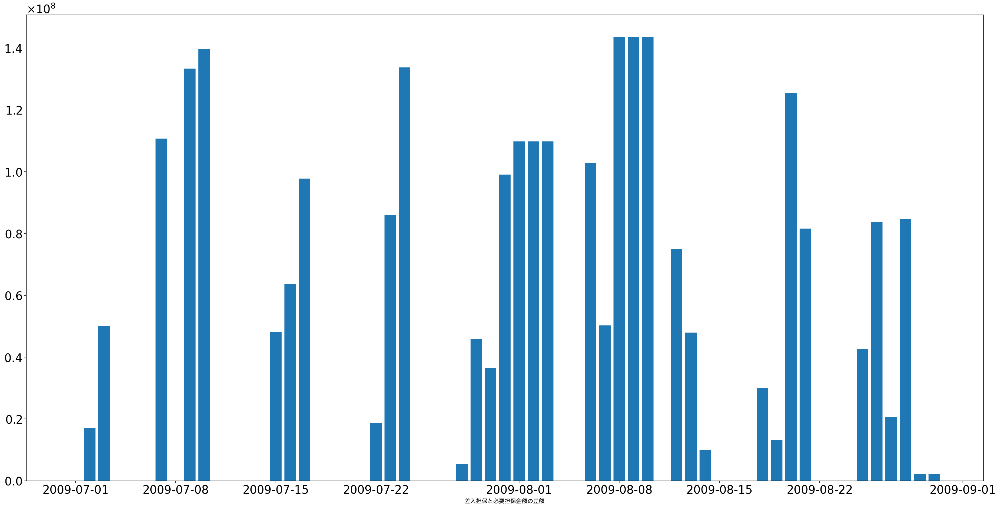

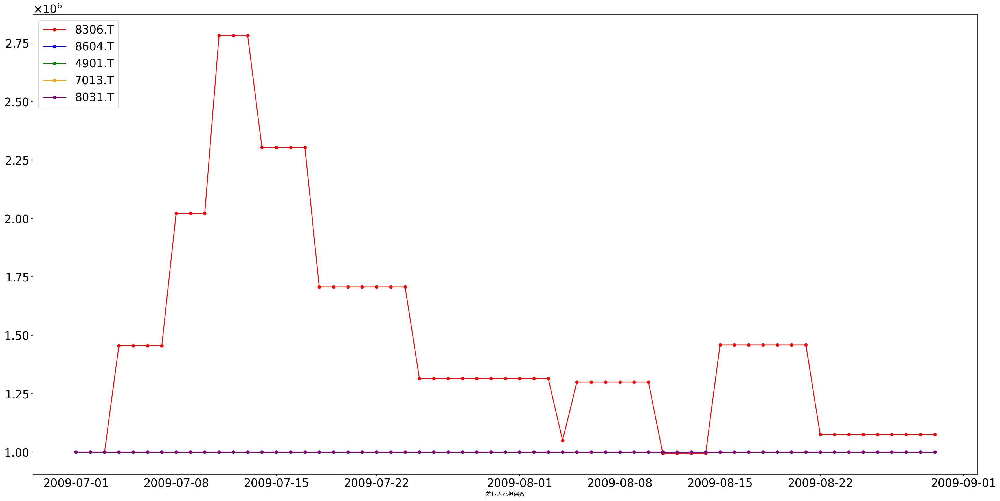

In [15]:
visualizer_s1_m3 = LogVisualizer(logs_s1_m3, './data0118/s1_m3')
# visualizer_s1_m0.plt_initial_collateral_portfolio_value()
visualizer_s1_m3.bar_collateral_price_diff()
_ = visualizer_s1_m3.plt_collateral_num(ymin=0, ymax=7.0e+6)

### model4
ベースモデル（複数トークン価格調整、マージンコール閾値設定あり）

In [16]:
simulator_s1_m4 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_down, lender_portfolio_jpy_1, start_date_1, end_date_1,  options=options_4)
print('Start simulation model4...')
%time logs_s1_m4 = simulator_s1_m4.execute()
print("End simulation model4!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 6983450000, 'is_usd': False, 'priority': 1}}"
2009-07-01: Price updating...
JPY: 1.0
2009-07-01: Price updating...
8306.T: 602.0
8604.T: 810.0
4901.T: 3120.0
7013.T: 1690.0
8031.T: 1129.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 602.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 810.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 3120.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1690.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 1129.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2

2009-07-06: Price updating...
JPY: 1.0
2009-07-06: Price updating...
8306.T: 595.0
8604.T: 822.0
4901.T: 3030.0
7013.T: 1550.0
8031.T: 1083.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  147020000.0
price_diff:  -485.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 3030.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1550.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1083.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1455463, 'price': 595.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 822.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-07
2009-07-07: Price updating...
JPY: 1.0
2009-07-07: Price updating...
8306.T: 589.0
8604.T: 793.0
4901.T: 3010.0
7013.T: 1510.0
8031.T:

2009-07-15: Price updating...
JPY: 1.0
2009-07-15: Price updating...
8306.T: 538.0
8604.T: 707.0
4901.T: 2925.0
7013.T: 1480.0
8031.T: 1048.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  147020000.0
price_diff:  -45555096.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2925.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1480.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 751568, 'price': 1048.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2782364, 'price': 538.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 707.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-16
2009-07-16: Price updating...
JPY: 1.0
2009-07-16: Price updating...
8306.T: 533.0
8604.T: 714.0
4901.T: 2890.0
7013.T: 1490.0
803

2009-07-25: Price updating...
JPY: 1.0
2009-07-25: Price updating...
8306.T: 553.0
8604.T: 820.0
4901.T: 2985.0
7013.T: 1650.0
8031.T: 1169.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 478644, 'is_usd': False, 'price': 1169.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2985.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1650.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 305690, 'price': 1169.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2782364, 'price': 553.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 820.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-26
2009-07-26: Price updating...
JPY: 1.0
2009-07-26: Price updating...
8306.T: 553.0
8604.T: 820.0
4901.

2009-08-04: Price updating...
JPY: 1.0
2009-08-04: Price updating...
8306.T: 600.0
8604.T: 814.0
4901.T: 2920.0
7013.T: 1740.0
8031.T: 1247.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  147020000.0
price_diff:  7236086.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2920.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1740.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 160662, 'price': 1247.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2782364, 'price': 600.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 814.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-05
2009-08-05: Price updating...
JPY: 1.0
2009-08-05: Price updating...
8306.T: 597.0
8604.T: 784.0
4901.T: 2860.0
7013.T: 1660.0
8031.

8306.T: 603.0
8604.T: 828.0
4901.T: 2865.0
7013.T: 1750.0
8031.T: 1260.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  147020000.0
price_diff:  26828928.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2865.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1750.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 161433, 'price': 1260.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2782364, 'price': 603.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 828.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-14
2009-08-14: Price updating...
JPY: 1.0
2009-08-14: Price updating...
8306.T: 607.0
8604.T: 837.0
4901.T: 2825.0
7013.T: 1780.0
8031.T: 1295.0
price diff is so little that auto margin call is cancelled

from Lender(B) to Borrower(A)
"8031.T: {'num': 369560, 'is_usd': False, 'price': 1255.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2810.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1830.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 186570, 'price': 1255.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2782364, 'price': 598.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 813.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-23
2009-08-23: Price updating...
JPY: 1.0
2009-08-23: Price updating...
8306.T: 598.0
8604.T: 813.0
4901.T: 2810.0
7013.T: 1830.0
8031.T: 1255.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold pric

Log Visualizer initialized.


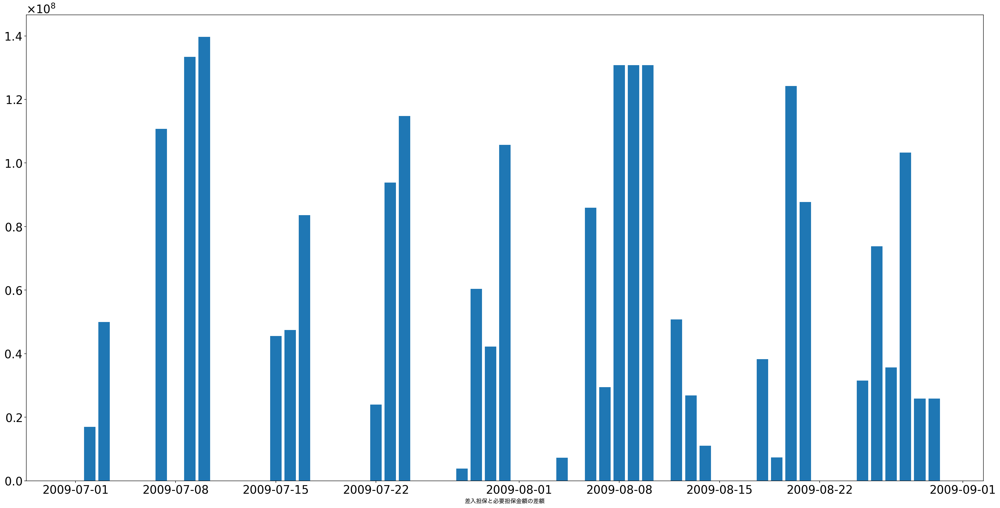

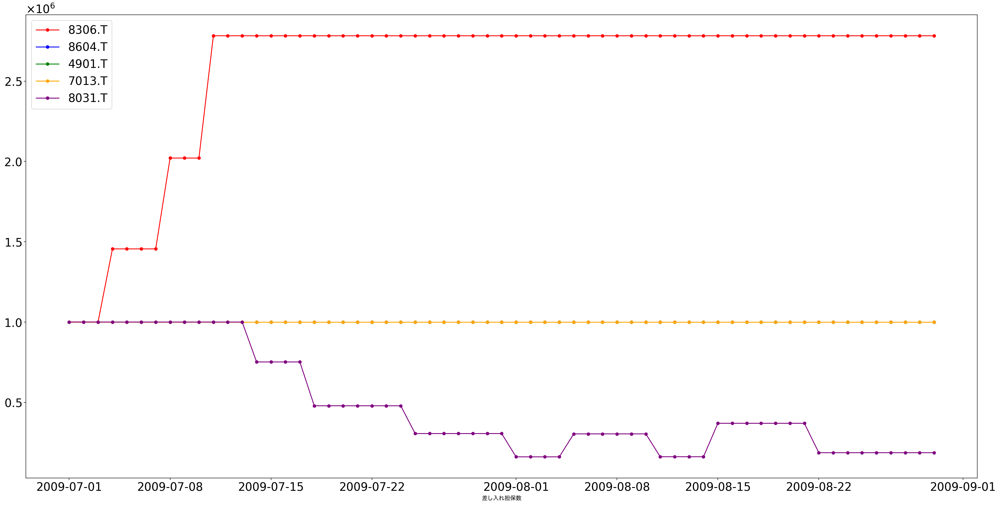

In [17]:
visualizer_s1_m4 = LogVisualizer(logs_s1_m4, './data0118/s1_m4')
# visualizer_s1_m0.plt_initial_collateral_portfolio_value()
visualizer_s1_m4.bar_collateral_price_diff()
_ = visualizer_s1_m4.plt_collateral_num(ymin=0, ymax=7.0e+6)

## シナリオ2: 急落

In [18]:
# シミュレーションの日付設定
start_date_2 = date(2008, 10, 1)
end_date_2 = date(2008, 12, 1)

### model0
現行手続きモデル

In [76]:
simulator_s2_m0 = ExecuteAutoAdjustmentTransactionSingle(borrower_portfolio_down, lender_portfolio_jpy_2, start_date_2, end_date_2,  options=options_0)
print('Start simulation model0...')
%time logs_s2_m0 = simulator_s2_m0.execute()
print("End simulation model0!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 7595250000, 'is_usd': False, 'priority': 1}}"
2008-10-01: Price updating...
JPY: 1.0
2008-10-01: Price updating...
8306.T: 923.0
8604.T: 1405.0
4901.T: 2715.0
7013.T: 1600.0
8031.T: 1352.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 923.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 1405.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 2715.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1600.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 1352.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@

2008-10-09: Price updating...
JPY: 1.0
2008-10-09: Price updating...
8306.T: 776.0
8604.T: 1229.0
4901.T: 2125.0
7013.T: 1280.0
8031.T: 1060.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-10
2008-10-10: Price updating...
JPY: 1.0
2008-10-10: Price updating...
8306.T: 710.0
8604.T: 1225.0
4901.T: 1952.0
7013.T: 1230.0
8031.T: 1040.0
adjust by single token manually.
from Borrower(A) to Lender(B)
!!!!additional token issuing by Borrower(A)!!!!
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-11
2008-10-11

from Borrower(A) to Lender(B)
!!!!additional token issuing by Borrower(A)!!!!
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-26
2008-10-26: Price updating...
JPY: 1.0
2008-10-26: Price updating...
8306.T: 583.0
8604.T: 904.0
4901.T: 1755.0
7013.T: 980.0
8031.T: 762.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-27
2008-10-27: Price updating...
JPY: 1.0
2008-10-27: Price updating...
8306.T: 583.0
8604.T: 904.0
4901.T: 1755.0
7013.T: 980.0
8031.T: 762.0
adjust by single token manually.
from Borrower(A)

2008-11-11: Price updating...
JPY: 1.0
2008-11-11: Price updating...
8306.T: 633.0
8604.T: 940.0
4901.T: 2300.0
7013.T: 1310.0
8031.T: 973.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-12
2008-11-12: Price updating...
JPY: 1.0
2008-11-12: Price updating...
8306.T: 615.0
8604.T: 905.0
4901.T: 2310.0
7013.T: 1280.0
8031.T: 928.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
200

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-28
2008-11-28: Price updating...
JPY: 1.0
2008-11-28: Price updating...
8306.T: 521.0
8604.T: 688.0
4901.T: 2305.0
7013.T: 1120.0
8031.T: 846.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-29
2008-11-29: Price updating...
JPY: 1.0
2008-11-29: Price updating...
8306.T: 509.0
8604.T: 678.0
4901.T: 2300.0
7013.T: 1110.0
8031.T: 852.0
adjust by single token ma

Log Visualizer initialized.


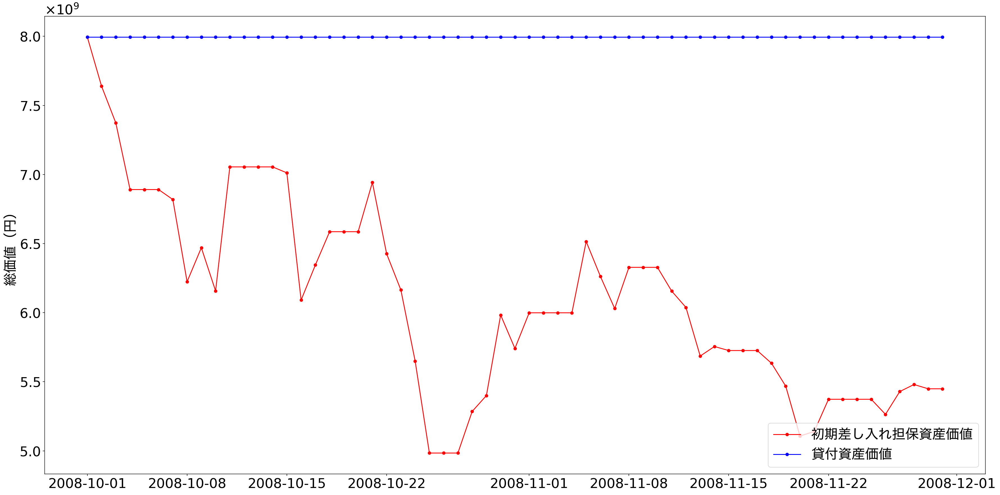

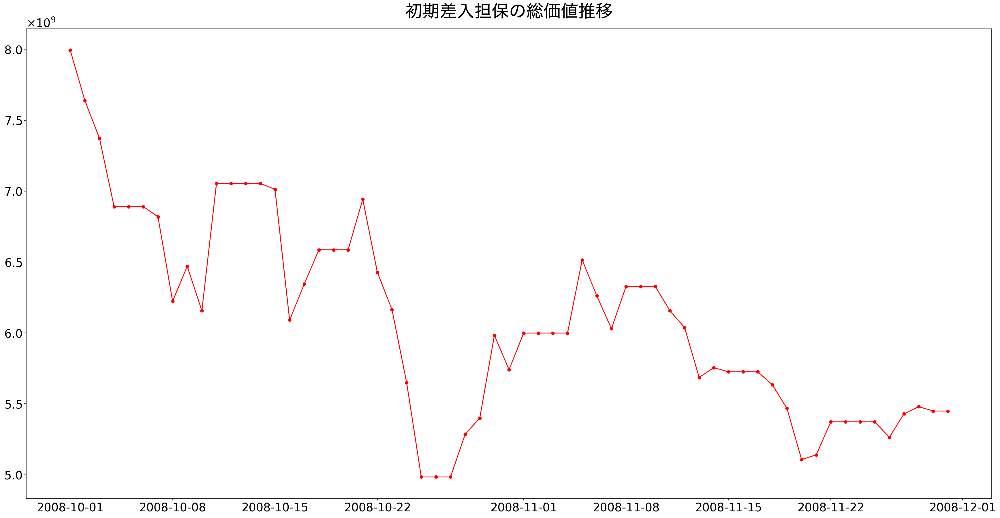

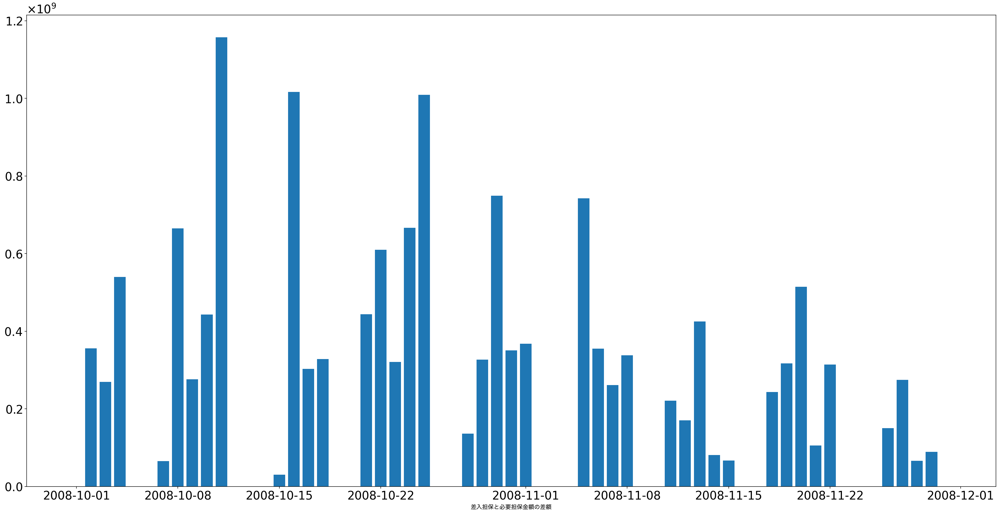

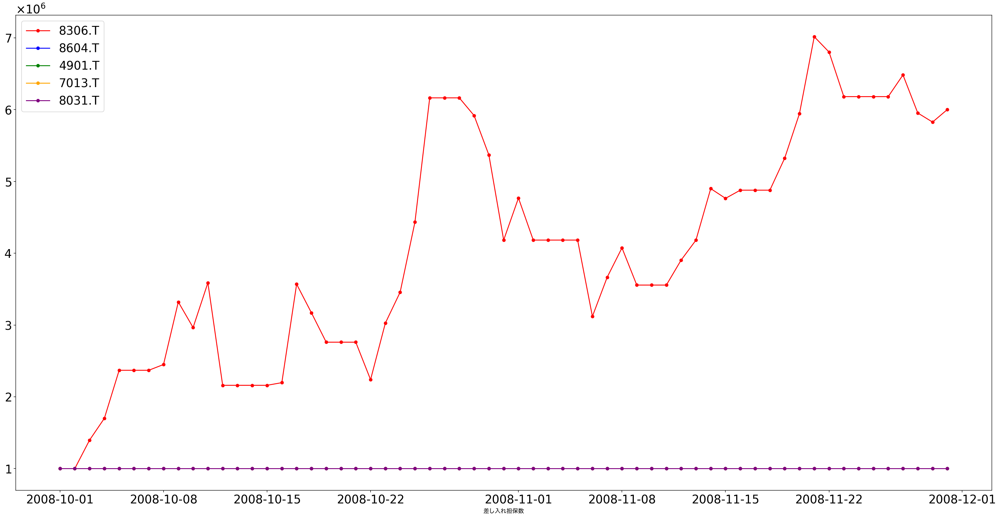

In [77]:
visualizer_s2_m0 = LogVisualizer(logs_s2_m0, './data0118/s2_m0')
visualizer_s2_m0.compare_initial_collateral_portfolio()
visualizer_s2_m0.plt_initial_collateral_portfolio_value()
visualizer_s2_m0.bar_collateral_price_diff()
_ = visualizer_s2_m0.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model1
ベースモデル（単一トークン価格調整、マージンコール閾値設定なし）

In [78]:
simulator_s2_m1 = ExecuteAutoAdjustmentTransactionSingle(borrower_portfolio_down, lender_portfolio_jpy_2, start_date_2, end_date_2,  options=options_1)
print('Start simulation model1...')
%time logs_s2_m1 = simulator_s2_m1.execute()
print("End simulation model1!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 7595250000, 'is_usd': False, 'priority': 1}}"
2008-10-01: Price updating...
JPY: 1.0
2008-10-01: Price updating...
8306.T: 923.0
8604.T: 1405.0
4901.T: 2715.0
7013.T: 1600.0
8031.T: 1352.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 923.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 1405.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 2715.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1600.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 1352.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@

2008-10-06: Price updating...
JPY: 1.0
2008-10-06: Price updating...
8306.T: 806.0
8604.T: 1241.0
4901.T: 2350.0
7013.T: 1380.0
8031.T: 1114.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1380.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1114.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2369728, 'price': 806.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1241.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-07
2008-10-07: Price updating...
JPY: 1.0
2008-10-07: Price updating...
8306.T: 811.0
8604.T: 1250.0
4901.T: 

7013.T: 1370.0
8031.T: 1178.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2230.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1370.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1178.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2197321, 'price': 821.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1413.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-16
2008-10-16: Price updating...
JPY: 1.0
2008-10-16: Price updating...
8306.T: 741.0
8604.T: 1215.0
4901.T: 1947.0
7013.T: 1210.0
8031.T: 978.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adj

--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1983.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1070.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 859.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4433383, 'price': 683.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1055.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-25
2008-10-25: Price updating...
JPY: 1.0
2008-10-25: Price updating...
8306.T: 583.0
8604.T: 904.0
4901.T: 1755.0
7013.T: 980.0
8031.T: 762.0
adjust by single token.
from Borrower(A) to Lender(B)
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': Fals

2008-11-03: Price updating...
JPY: 1.0
2008-11-03: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2310.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1210.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 925.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4183413, 'price': 627.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 927.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-04
2008-11-04: Price updating...
JPY: 1.0
2008-11-04: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.

--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2310.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 928.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4182114, 'price': 615.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 905.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-13
2008-11-13: Price updating...
JPY: 1.0
2008-11-13: Price updating...
8306.T: 592.0
8604.T: 855.0
4901.T: 2210.0
7013.T: 1170.0
8031.T: 859.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 10000

2008-11-22: Price updating...
JPY: 1.0
2008-11-22: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 2280.0
7013.T: 1140.0
8031.T: 754.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2280.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1140.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 754.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 6181818, 'price': 506.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 693.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-23
2008-11-23: Price updating...
JPY: 1.0
2008-11-23: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 2280.

Log Visualizer initialized.


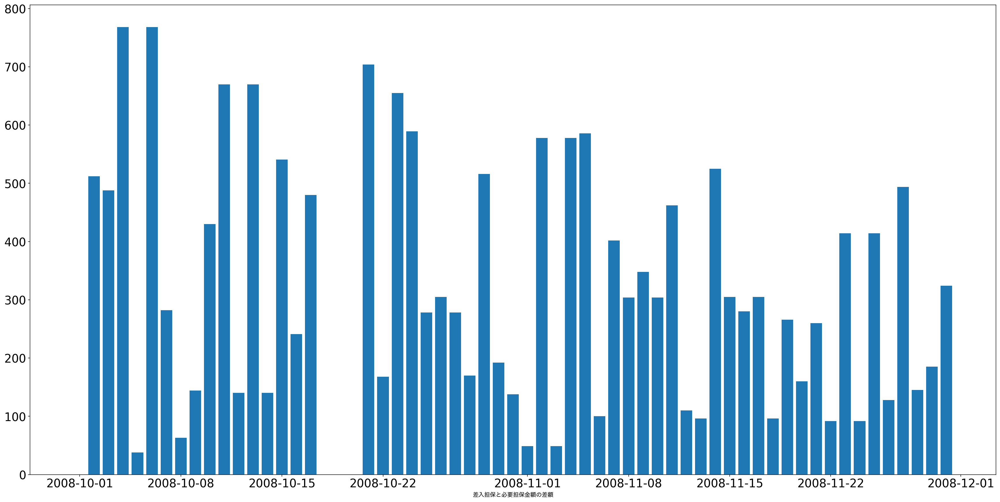

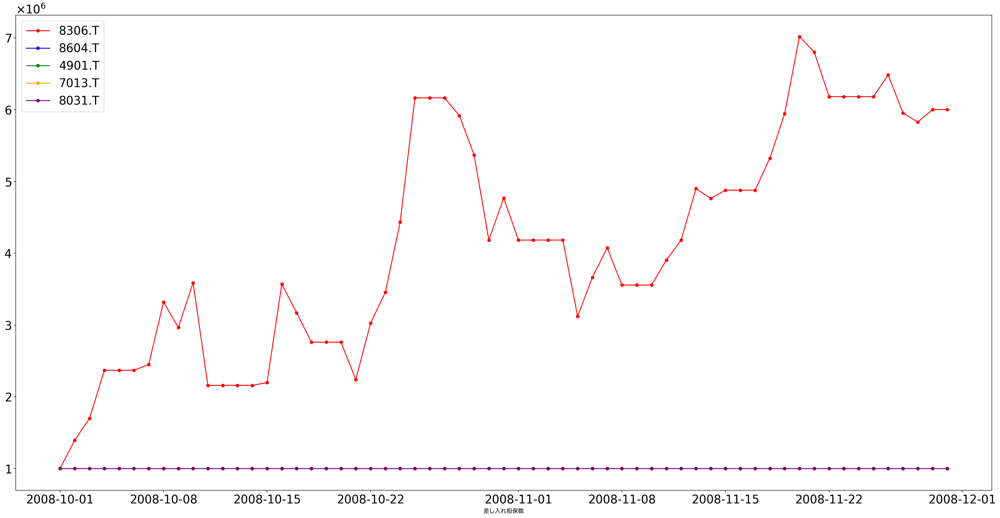

In [79]:
visualizer_s2_m1 = LogVisualizer(logs_s2_m1, './data0118/s2_m1')
# visualizer_s2_m0.plt_initial_collateral_portfolio_value()
visualizer_s2_m1.bar_collateral_price_diff()
_ = visualizer_s2_m1.plt_collateral_num(ymin=0, ymax=1.5e+6)

### model2
ベースモデル（複数トークン価格調整、マージンコール閾値設定なし）

In [19]:
simulator_s2_m2 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_down, lender_portfolio_jpy_2, start_date_2, end_date_2,  options=options_2)
print('Start simulation model2...')
%time logs_s2_m2 = simulator_s2_m2.execute()
print("End simulation model2!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 7595250000, 'is_usd': False, 'priority': 1}}"
2008-10-01: Price updating...
JPY: 1.0
2008-10-01: Price updating...
8306.T: 923.0
8604.T: 1405.0
4901.T: 2715.0
7013.T: 1600.0
8031.T: 1352.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 923.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 1405.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 2715.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1600.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 1352.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@

2008-10-05: Price updating...
JPY: 1.0
2008-10-05: Price updating...
8306.T: 806.0
8604.T: 1241.0
4901.T: 2350.0
7013.T: 1380.0
8031.T: 1114.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 1000000, 'is_usd': False, 'price': 1114.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1380.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 999999, 'price': 1114.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2369728, 'price': 806.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1241.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-06
2008-10-06: Price updating...
JPY: 1.0
2008-10-06: Price updating...
8306.T: 806.0
8604.T: 1241.0
4

2008-10-13: Price updating...
JPY: 1.0
2008-10-13: Price updating...
8306.T: 810.0
8604.T: 1425.0
4901.T: 2210.0
7013.T: 1370.0
8031.T: 1240.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 67038, 'is_usd': False, 'price': 1240.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2210.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1370.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 67037, 'price': 1240.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3588733, 'price': 810.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1425.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-14
2008-10-14: Price updating...
JPY: 1.0
2008-10-14: Price updating...
8306.T: 810.0
8604.T: 1425.0
4901

{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2365.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 945164, 'price': 1310.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 0, 'price': 1074.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3588733, 'price': 849.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1345.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-22
2008-10-22: Price updating...
JPY: 1.0
2008-10-22: Price updating...
8306.T: 774.0
8604.T: 1232.0
4901.T: 2190.0
7013.T: 1250.0
8031.T: 980.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 774.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 1232.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2190.0}"
"7013.T: {'num': 54836, 'is_usd': False

2008-10-29: Price updating...
JPY: 1.0
2008-10-29: Price updating...
8306.T: 594.0
8604.T: 861.0
4901.T: 2000.0
7013.T: 1110.0
8031.T: 835.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 828838, 'is_usd': False, 'price': 835.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2000.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1110.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 433758, 'price': 835.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 6164666, 'price': 594.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 861.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-30
2008-10-30: Price updating...
JPY: 1.0
2008-10-30: Price updating...
8306.T: 632.0
8604.T: 961.0
4901.T: 

8604.T: 948.0
4901.T: 2350.0
7013.T: 1280.0
8031.T: 1034.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 650.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 948.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2350.0}"
"7013.T: {'num': 814769, 'is_usd': False, 'priority': 2, 'price': 1280.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 539037, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 0, 'price': 1034.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 6164666, 'price': 650.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 948.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

2008-11-14: Price updating...
JPY: 1.0
2008-11-14: Price updating...
8306.T: 595.0
8604.T: 861.0
4901.T: 2265.0
7013.T: 1180.0
8031.T: 854.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 128659, 'is_usd': False, 'price': 854.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2265.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1180.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 24617, 'price': 854.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 6164666, 'price': 595.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 861.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-15
2008-11-15: Price updating...
JPY: 1.0
2008-11-15: Price updating...
8306.T: 585.0
8604.T: 837.0
4901.T: 2

2008-11-22: Price updating...
JPY: 1.0
2008-11-22: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 2280.0
7013.T: 1140.0
8031.T: 754.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 860291, 'is_usd': False, 'price': 754.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2280.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1140.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 439743, 'price': 754.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 7016667, 'price': 506.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 693.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-23
2008-11-23: Price updating...
JPY: 1.0
2008-11-23: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 

2008-11-30: Price updating...
JPY: 1.0
2008-11-30: Price updating...
8306.T: 509.0
8604.T: 678.0
4901.T: 2300.0
7013.T: 1110.0
8031.T: 852.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 393799, 'is_usd': False, 'price': 852.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2300.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1110.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 393798, 'price': 852.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 7016667, 'price': 509.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 678.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
Finished!!!!
CPU times: user 59.2 s, sys: 4.31 s, total: 1min 3s
Wall time: 13min 57s
End simulation model2!!!


Log Visualizer initialized.


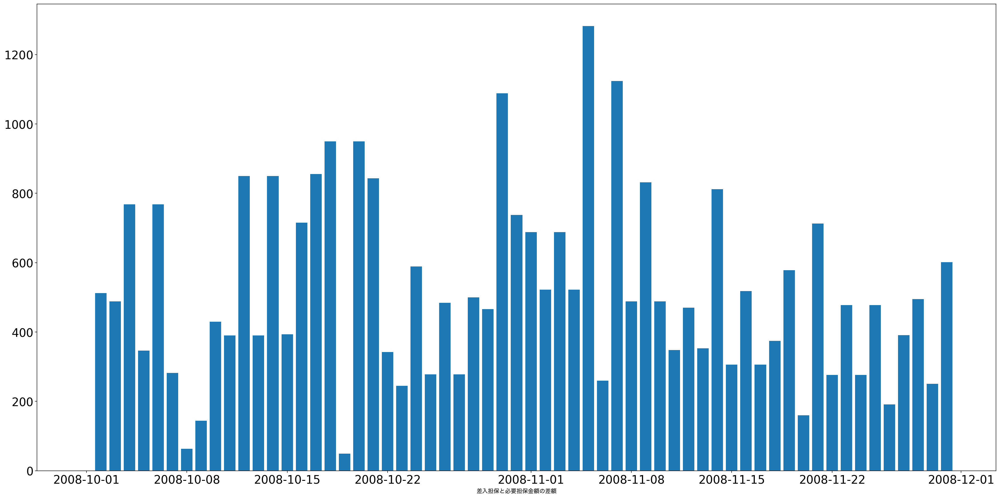

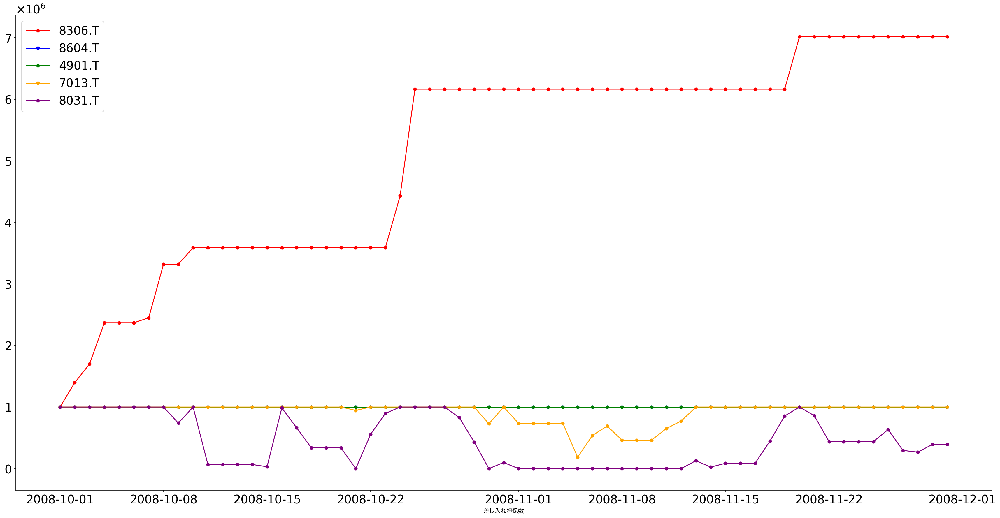

In [20]:
visualizer_s2_m2 = LogVisualizer(logs_s2_m2, './data0118/s2_m2')
# visualizer_s2_m0.plt_initial_collateral_portfolio_value()
visualizer_s2_m2.bar_collateral_price_diff()
_ = visualizer_s2_m2.plt_collateral_num(ymin=0, ymax=1.5e+6)

### model3
ベースモデル（単一トークン価格調整、マージンコール閾値設定あり）

In [21]:
simulator_s2_m3 = ExecuteAutoAdjustmentTransactionSingle(borrower_portfolio_down, lender_portfolio_jpy_2, start_date_2, end_date_2,  options=options_3)
print('Start simulation model3...')
%time logs_s2_m3 = simulator_s2_m3.execute()
print("End simulation model3!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 7595250000, 'is_usd': False, 'priority': 1}}"
2008-10-01: Price updating...
JPY: 1.0
2008-10-01: Price updating...
8306.T: 923.0
8604.T: 1405.0
4901.T: 2715.0
7013.T: 1600.0
8031.T: 1352.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 923.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 1405.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 2715.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1600.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 1352.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@

2008-10-06: Price updating...
JPY: 1.0
2008-10-06: Price updating...
8306.T: 806.0
8604.T: 1241.0
4901.T: 2350.0
7013.T: 1380.0
8031.T: 1114.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  159900000.0
price_diff:  -768.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1380.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1114.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2369728, 'price': 806.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1241.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-07
2008-10-07: Price updating...
JPY: 1.0
2008-10-07: Price updating...
8306.T: 811.0
8604.

2008-10-15: Price updating...
8306.T: 821.0
8604.T: 1413.0
4901.T: 2230.0
7013.T: 1370.0
8031.T: 1178.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  159900000.0
price_diff:  30235247.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2230.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1370.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1178.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2160493, 'price': 821.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1413.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-16
2008-10-16: Price updating...
JPY: 1.0
2008-10-16: Price updating...
8306.T: 741.0
8604.T: 1215.0
4901.T: 1947.0
7013.T: 12

--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1983.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1070.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 859.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4433383, 'price': 683.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1055.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-25
2008-10-25: Price updating...
JPY: 1.0
2008-10-25: Price updating...
8306.T: 583.0
8604.T: 904.0
4901.T: 1755.0
7013.T: 980.0
8031.T: 762.0
adjust by single token.
from Borrower(A) to Lender(B)
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': Fals

2008-11-03: Price updating...
JPY: 1.0
2008-11-03: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  159900000.0
price_diff:  49.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2310.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1210.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 925.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4183413, 'price': 627.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 927.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-04
2008-11-04: Price updating...
JPY: 1.0
2008-11-04: Price updating...
8306.T: 627.0
8604.T: 927

7013.T: 1280.0
8031.T: 928.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2310.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 928.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4182114, 'price': 615.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 905.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-13
2008-11-13: Price updating...
JPY: 1.0
2008-11-13: Price updating...
8306.T: 592.0
8604.T: 855.0
4901.T: 2210.0
7013.T: 1170.0
8031.T: 859.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustm

--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1140.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 753.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 7016667, 'price': 492.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 645.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-22
2008-11-22: Price updating...
JPY: 1.0
2008-11-22: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 2280.0
7013.T: 1140.0
8031.T: 754.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 10000

Log Visualizer initialized.


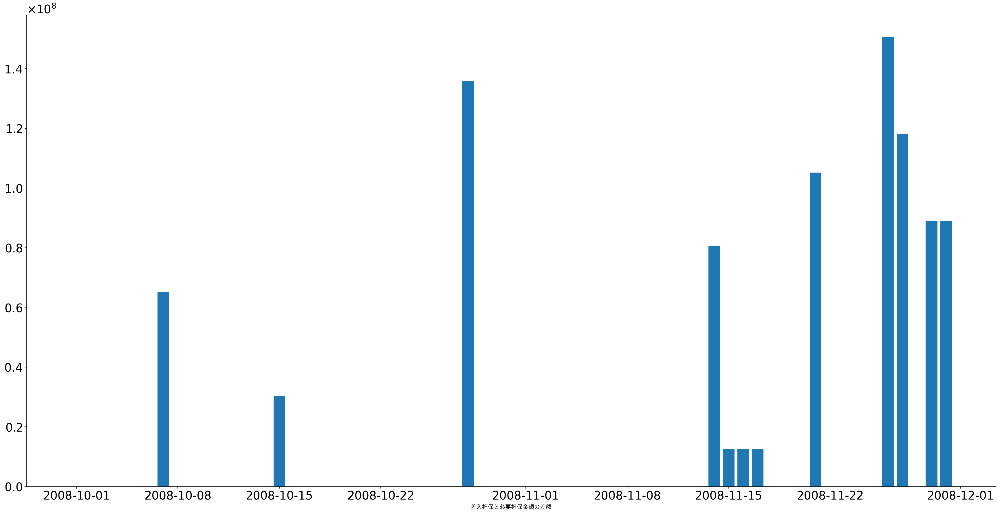

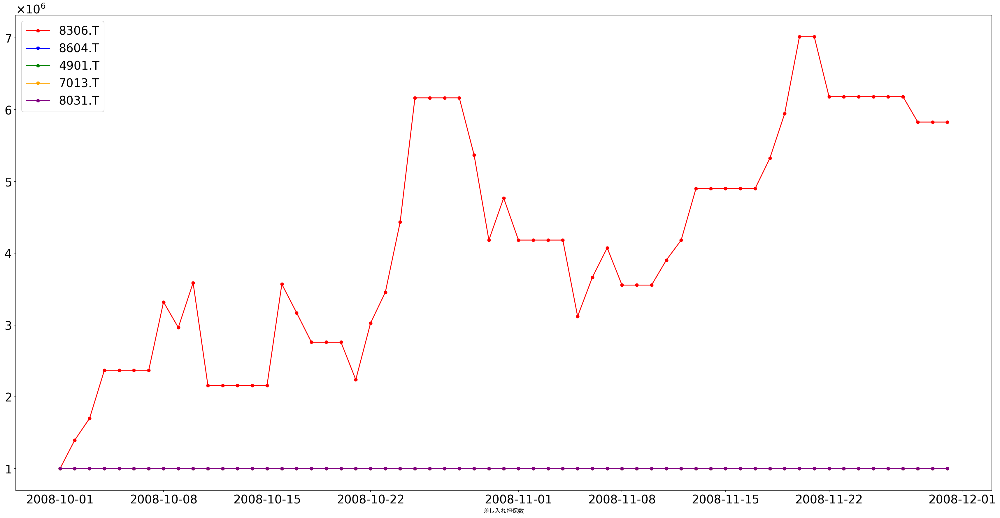

In [22]:
visualizer_s2_m3 = LogVisualizer(logs_s2_m3, './data0118/s2_m3')
# visualizer_s2_m0.plt_initial_collateral_portfolio_value()
visualizer_s2_m3.bar_collateral_price_diff()
_ = visualizer_s2_m3.plt_collateral_num(ymin=0, ymax=1.5e+6)

### model4
ベースモデル（複数トークン価格調整、マージンコール閾値設定あり）

In [23]:
simulator_s2_m4 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_down, lender_portfolio_jpy_2, start_date_2, end_date_2,  options=options_4)
print('Start simulation model4...')
%time logs_s2_m4 = simulator_s2_m4.execute()
print("End simulation model4!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 7595250000, 'is_usd': False, 'priority': 1}}"
2008-10-01: Price updating...
JPY: 1.0
2008-10-01: Price updating...
8306.T: 923.0
8604.T: 1405.0
4901.T: 2715.0
7013.T: 1600.0
8031.T: 1352.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 923.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 1405.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 2715.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1600.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 1352.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@

2008-10-05: Price updating...
JPY: 1.0
2008-10-05: Price updating...
8306.T: 806.0
8604.T: 1241.0
4901.T: 2350.0
7013.T: 1380.0
8031.T: 1114.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  159900000.0
price_diff:  -768.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1380.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1114.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2369728, 'price': 806.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1241.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-06
2008-10-06: Price updating...
JPY: 1.0
2008-10-06: Price updating...
8306.T: 806.0
8604.T: 1241.0
4901.T: 2350.0
7013.T: 1380.0
8031

2008-10-14: Price updating...
JPY: 1.0
2008-10-14: Price updating...
8306.T: 810.0
8604.T: 1425.0
4901.T: 2210.0
7013.T: 1370.0
8031.T: 1240.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  159900000.0
price_diff:  390.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2210.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1370.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 67037, 'price': 1240.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3588733, 'price': 810.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1425.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-15
2008-10-15: Price updating...
JPY: 1.0
2008-10-15: Price updating...
8306.T: 821.0
8604.T: 1413.0
4901.T: 2230.0
7013.T: 1370.0
8031.T:

2008-10-23: Price updating...
JPY: 1.0
2008-10-23: Price updating...
8306.T: 745.0
8604.T: 1179.0
4901.T: 2110.0
7013.T: 1190.0
8031.T: 940.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 745.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 1179.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2110.0}"
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 1190.0}"
"8031.T: {'num': 443550, 'is_usd': False, 'priority': 1, 'price': 940.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1190.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 896164, 'price': 940.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3588733, 'price': 745.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1179.0, 'priority': 4}}
OK. collateral is move

{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2145.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1170.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 98845, 'price': 926.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 6164666, 'price': 598.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 902.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-01
2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 98845, 'is_usd': False, 'price': 925.0, 'priority': 1}"
"7013.T: {'num': 1000000, 'is_usd': False, 'price': 1210.0, 'priority': 2}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'n

2008-11-09: Price updating...
JPY: 1.0
2008-11-09: Price updating...
8306.T: 652.0
8604.T: 975.0
4901.T: 2390.0
7013.T: 1320.0
8031.T: 991.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  159900000.0
price_diff:  488.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2390.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 462604, 'price': 1320.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 0, 'price': 991.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 6164666, 'price': 652.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 975.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-10
2008-11-10: Price updating...
JPY: 1.0
2008-11-10: Price updating...
8306.T: 652.0
8604.T: 975.0
4901.T: 2390.0
7013.T: 1320.0
8031.T: 991.0
pri

2008-11-18: Price updating...
JPY: 1.0
2008-11-18: Price updating...
8306.T: 546.0
8604.T: 776.0
4901.T: 2295.0
7013.T: 1190.0
8031.T: 827.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 546.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 776.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2295.0}"
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 1190.0}"
"8031.T: {'num': 871341, 'is_usd': False, 'priority': 1, 'price': 827.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2295.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1190.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 445094, 'price': 827.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 6164666, 'price': 546.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 776.0, 'priority': 4}}
OK. collateral is moved.


2008-11-27: Price updating...
JPY: 1.0
2008-11-27: Price updating...
8306.T: 518.0
8604.T: 680.0
4901.T: 2330.0
7013.T: 1120.0
8031.T: 781.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  159900000.0
price_diff:  -113072789.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2330.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1120.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 439743, 'price': 781.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 7016667, 'price': 518.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 680.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-28
2008-11-28: Price updating...
JPY: 1.0
2008-11-28: Price updating...
8306.T: 521.0
8604.T: 688.0
4901.T: 2305.0
7013.T: 1120.0
8031

Log Visualizer initialized.


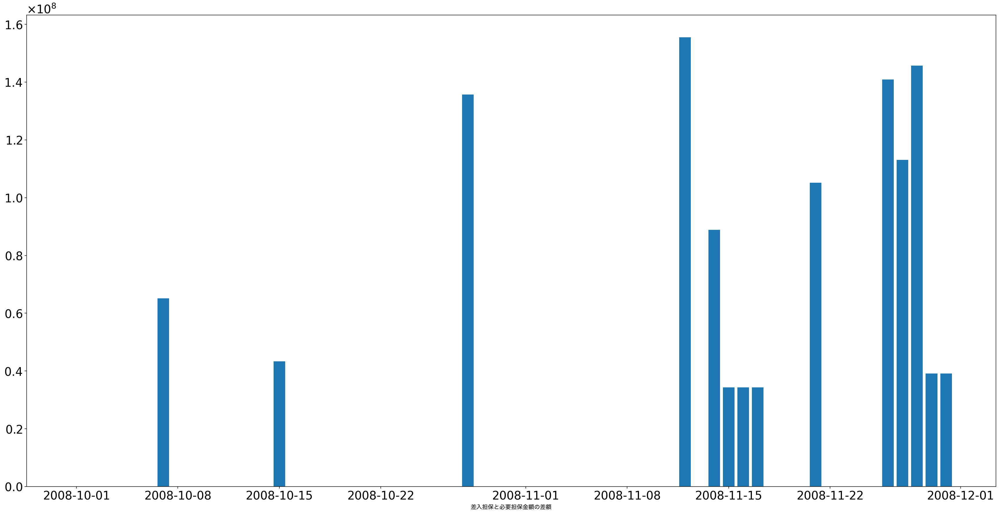

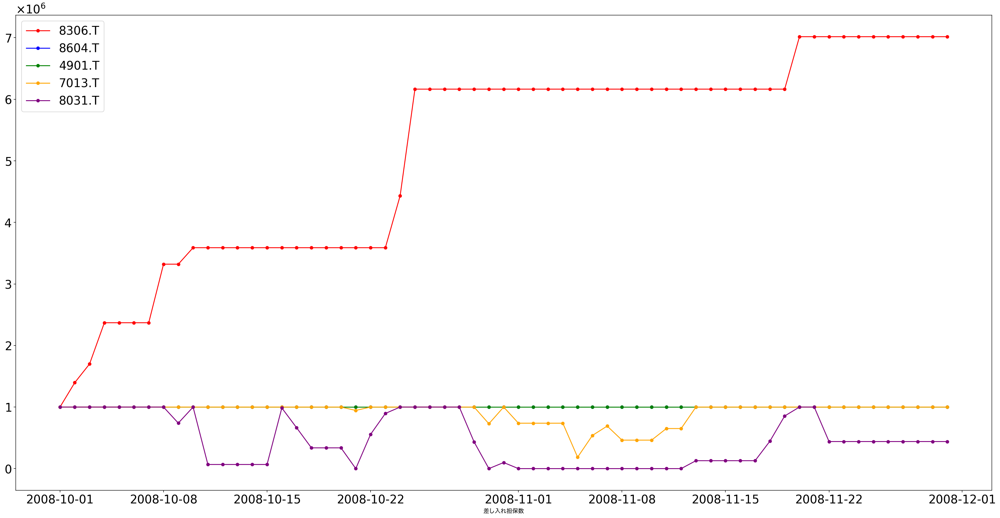

In [24]:
visualizer_s2_m4 = LogVisualizer(logs_s2_m4, './data0118/s2_m4')
# visualizer_s2_m0.plt_initial_collateral_portfolio_value()
visualizer_s2_m4.bar_collateral_price_diff()
_ = visualizer_s2_m4.plt_collateral_num(ymin=0, ymax=1.5e+6)

## シナリオ3: 急騰

In [12]:
# シミュレーションの日付設定
start_date_3 = date(2009, 3, 1)
end_date_3 = date(2009, 5, 1)

### model0
現行手続きモデル

In [13]:
simulator_s3_m0 = ExecuteAutoAdjustmentTransactionSingle(borrower_portfolio_down, lender_portfolio_jpy_3, start_date_3, end_date_3,  options=options_0)
print('Start simulation model0...')
%time logs_s3_m0 = simulator_s3_m0.execute()
print("End simulation model0!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 4106850000, 'is_usd': False, 'priority': 1}}"
2009-03-01: Price updating...
JPY: 1.0
2009-03-01: Price updating...
8306.T: 423.0
8604.T: 434.0
4901.T: 1771.0
7013.T: 810.0
8031.T: 885.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 423.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 434.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 1771.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 810.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 885.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2009-

2009-03-06: Price updating...
JPY: 1.0
2009-03-06: Price updating...
8306.T: 401.0
8604.T: 417.0
4901.T: 1763.0
7013.T: 890.0
8031.T: 842.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1763.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 890.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 842.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1024938, 'price': 401.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 417.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-07
2009-03-07: Price updating...
JPY: 1.0
2009-03-07: Price updating...
8306.T: 381.0
8604.T: 414.0
4901.T: 1765.0

2009-03-16: Price updating...
JPY: 1.0
2009-03-16: Price updating...
8306.T: 441.0
8604.T: 481.0
4901.T: 1950.0
7013.T: 940.0
8031.T: 850.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1950.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 940.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 850.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 231292, 'price': 441.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 481.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-17
2009-03-17: Price updating...
JPY: 1.0
2009-03-17: Price updating...
8306.T: 477.0
8604.T: 507.0
4901.T: 2005.0


from Lender(B) to Borrower(A)
!!!!!!!!!!!!additional token issuing by Lender(B) num: 72114!!!!!!!!!!!!!!
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2250.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1100.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1071.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': -1193610, 'price': 532.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 537.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-26
2009-03-26: Price updating...
JPY: 1.0
2009-03-26: Price updating...
8306.T: 540.0
8604.T: 557.0
4901.T: 2310.0
7013.T: 1110.0
8031.T: 1077.0
adjust by single token manually.
from Lender(B) to Borrower(A)
!!!!!!!!!!!!additional token issuing by Lender(B) num: 160094!!!!!!!!!!

2009-04-04: Price updating...
JPY: 1.0
2009-04-04: Price updating...
8306.T: 513.0
8604.T: 585.0
4901.T: 2390.0
7013.T: 1270.0
8031.T: 1141.0
adjust by single token manually.
from Lender(B) to Borrower(A)
!!!!!!!!!!!!additional token issuing by Lender(B) num: 142467!!!!!!!!!!!!!!
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2390.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1270.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1141.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': -2072125, 'price': 513.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 585.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-05
2009-04-05: Price updating...
JPY: 1.0
2009-04-05: Price updating...
8306.T: 513.0
8604.T: 585.0
490

8031.T: 1206.0
adjust by single token manually.
from Lender(B) to Borrower(A)
!!!!!!!!!!!!additional token issuing by Lender(B) num: 1!!!!!!!!!!!!!!
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2615.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1330.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1206.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': -2736347, 'price': 531.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 625.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-14
2009-04-14: Price updating...
JPY: 1.0
2009-04-14: Price updating...
8306.T: 537.0
8604.T: 647.0
4901.T: 2570.0
7013.T: 1280.0
8031.T: 1188.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustm

2009-04-23: Price updating...
JPY: 1.0
2009-04-23: Price updating...
8306.T: 478.0
8604.T: 598.0
4901.T: 2540.0
7013.T: 1530.0
8031.T: 1090.0
adjust by single token manually.
from Lender(B) to Borrower(A)
!!!!!!!!!!!!additional token issuing by Lender(B) num: 225475!!!!!!!!!!!!!!
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2540.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1530.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1090.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': -3002093, 'price': 478.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 598.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-24
2009-04-24: Price updating...
JPY: 1.0
2009-04-24: Price updating...
8306.T: 494.0
8604.T: 605.0
490

Log Visualizer initialized.


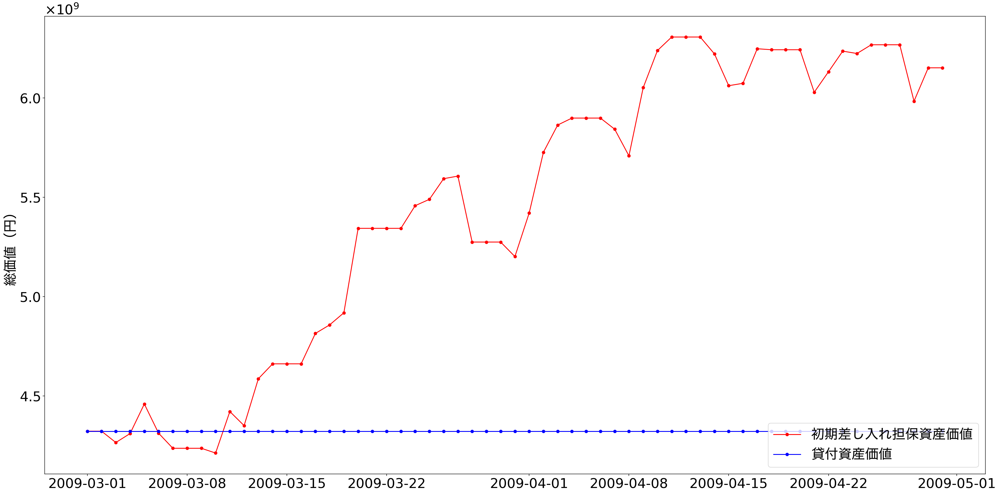

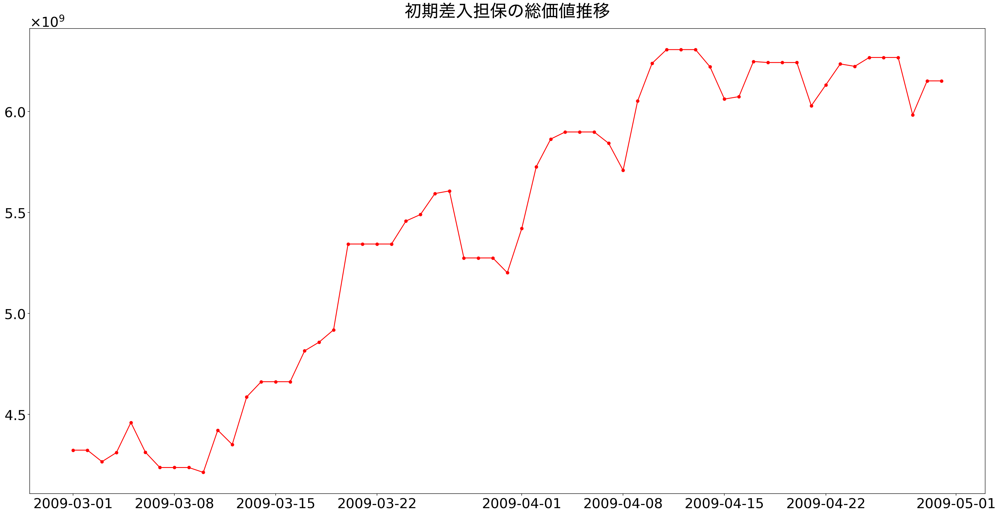

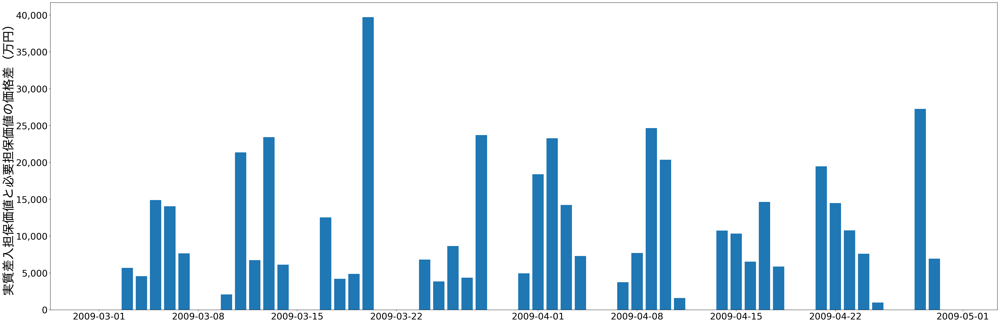

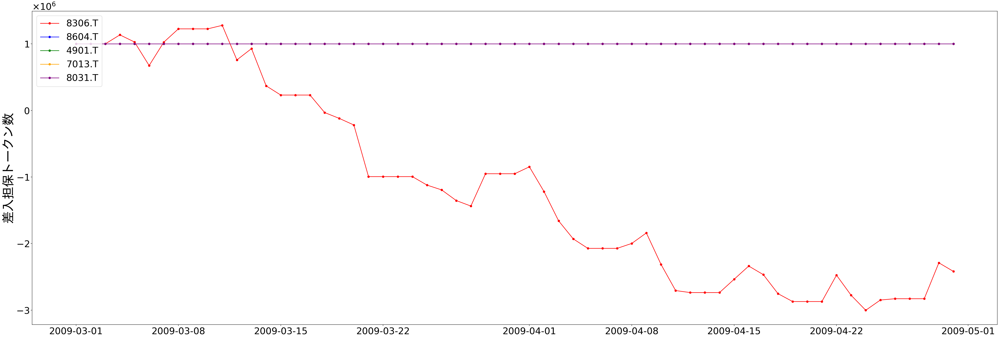

In [14]:
visualizer_s3_m0 = LogVisualizer(logs_s3_m0, './data0118/s3_m0')
visualizer_s3_m0.compare_initial_collateral_portfolio()
visualizer_s3_m0.plt_initial_collateral_portfolio_value()
visualizer_s3_m0.bar_collateral_price_diff()
_ = visualizer_s3_m0.plt_collateral_num(ymin=0, ymax=3.0e+6, show_additional_issue=False)

### model1
ベースモデル（単一トークン価格調整、マージンコール閾値設定なし）

In [15]:
simulator_s3_m1 = ExecuteAutoAdjustmentTransactionSingle(borrower_portfolio_down, lender_portfolio_jpy_3, start_date_3, end_date_3,  options=options_1)
print('Start simulation model1...')
%time logs_s3_m1 = simulator_s3_m1.execute()
print("End simulation model1!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 4106850000, 'is_usd': False, 'priority': 1}}"
2009-03-01: Price updating...
JPY: 1.0
2009-03-01: Price updating...
8306.T: 423.0
8604.T: 434.0
4901.T: 1771.0
7013.T: 810.0
8031.T: 885.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 423.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 434.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 1771.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 810.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 885.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2009-

2009-03-06: Price updating...
JPY: 1.0
2009-03-06: Price updating...
8306.T: 401.0
8604.T: 417.0
4901.T: 1763.0
7013.T: 890.0
8031.T: 842.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1763.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 890.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 842.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1024938, 'price': 401.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 417.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-07
2009-03-07: Price updating...
JPY: 1.0
2009-03-07: Price updating...
8306.T: 381.0
8604.T: 414.0
4901.T: 1765.0


--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1950.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 940.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 850.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 231293, 'price': 441.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 481.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-16
2009-03-16: Price updating...
JPY: 1.0
2009-03-16: Price updating...
8306.T: 441.0
8604.T: 481.0
4901.T: 1950.0
7013.T: 940.0
8031.T: 850.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000,

2009-03-25: Price updating...
JPY: 1.0
2009-03-25: Price updating...
8306.T: 532.0
8604.T: 537.0
4901.T: 2250.0
7013.T: 1100.0
8031.T: 1071.0
adjust by single token.
from Lender(B) to Borrower(A)
!!!!!!!!!!!!additional token issuing by Lender(B) num: 72114!!!!!!!!!!!!!!
--------------------DONE. Lender(B) adds 72114 tokens by tomorrow.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2250.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1100.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1071.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': -1121496, 'price': 532.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 537.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-26
2009-03-26: Price updating...
JPY: 1.0
2009-03-26: Price updating...
8306.T:

2009-04-03: Price updating...
JPY: 1.0
2009-04-03: Price updating...
8306.T: 526.0
8604.T: 590.0
4901.T: 2365.0
7013.T: 1250.0
8031.T: 1133.0
adjust by single token.
from Lender(B) to Borrower(A)
!!!!!!!!!!!!additional token issuing by Lender(B) num: 270567!!!!!!!!!!!!!!
--------------------DONE. Lender(B) adds 270567 tokens by tomorrow.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2365.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1250.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1133.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': -1659091, 'price': 526.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 590.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-04
2009-04-04: Price updating...
JPY: 1.0
2009-04-04: Price updating...
8306.

2009-04-12: Price updating...
JPY: 1.0
2009-04-12: Price updating...
8306.T: 531.0
8604.T: 625.0
4901.T: 2615.0
7013.T: 1330.0
8031.T: 1206.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2615.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1330.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1206.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': -2736346, 'price': 531.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 625.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-13
2009-04-13: Price updating...
JPY: 1.0
2009-04-13: Price updating...
8306.T: 531.0
8604.T: 625.0
4901.T: 26

2009-04-21: Price updating...
8306.T: 491.0
8604.T: 578.0
4901.T: 2515.0
7013.T: 1330.0
8031.T: 1115.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2515.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1330.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1115.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': -2474541, 'price': 491.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 578.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-22
2009-04-22: Price updating...
JPY: 1.0
2009-04-22: Price updating...
8306.T: 479.0
8604.T: 598.0
4901.T: 2525.0
7013.T: 1420.0
8031.T: 1110.0
adju

8604.T: 589.0
4901.T: 2500.0
7013.T: 1490.0
8031.T: 1038.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2500.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1490.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1038.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': -2418691, 'price': 535.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 589.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
Finished!!!!
CPU times: user 1min 1s, sys: 4.17 s, total: 1min 5s
Wall time: 7min 4s
End simulation model1!!!


Log Visualizer initialized.


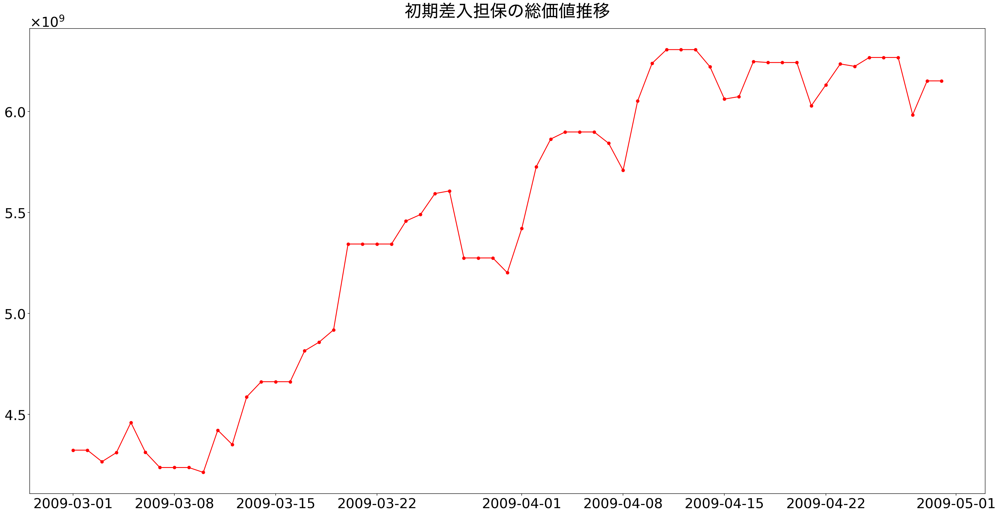

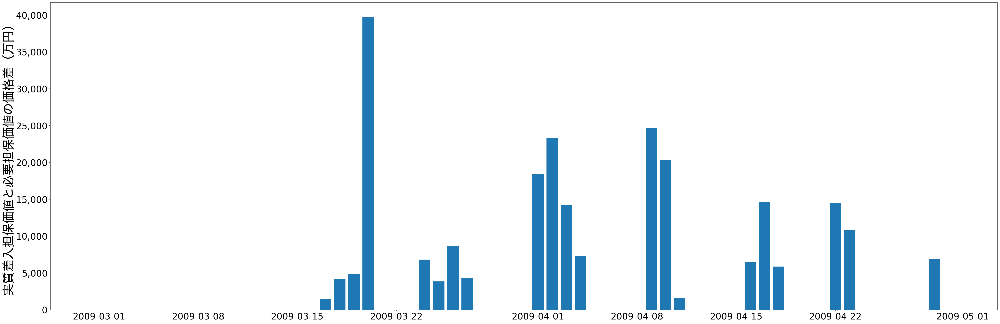

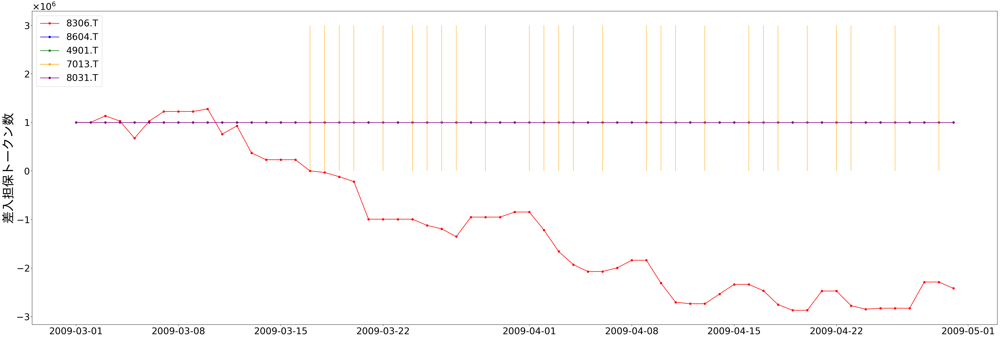

In [16]:
visualizer_s3_m1 = LogVisualizer(logs_s3_m1, './data0118/s3_m1')
visualizer_s3_m1.plt_initial_collateral_portfolio_value()
visualizer_s3_m1.bar_collateral_price_diff()
_ = visualizer_s3_m1.plt_collateral_num(ymin=0, ymax=3.0e+6)

### model2
ベースモデル（複数トークン価格調整、マージンコール閾値設定なし）

In [19]:
simulator_s3_m2 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_down, lender_portfolio_jpy_3, start_date_3, end_date_3,  options=options_2)
print('Start simulation model2...')
%time logs_s3_m2 = simulator_s3_m2.execute()
print("End simulation model2!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 4106850000, 'is_usd': False, 'priority': 1}}"
2009-03-01: Price updating...
JPY: 1.0
2009-03-01: Price updating...
8306.T: 423.0
8604.T: 434.0
4901.T: 1771.0
7013.T: 810.0
8031.T: 885.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 423.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 434.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 1771.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 810.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 885.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2009-

2009-03-06: Price updating...
JPY: 1.0
2009-03-06: Price updating...
8306.T: 401.0
8604.T: 417.0
4901.T: 1763.0
7013.T: 890.0
8031.T: 842.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 401.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 417.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 1763.0}"
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 890.0}"
"8031.T: {'num': 222733, 'is_usd': False, 'priority': 1, 'price': 842.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1763.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 890.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 947397, 'price': 842.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1135392, 'price': 401.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 417.0, 'priority': 4}}
OK. collateral is moved.
@@@

2009-03-14: Price updating...
JPY: 1.0
2009-03-14: Price updating...
8306.T: 441.0
8604.T: 481.0
4901.T: 1950.0
7013.T: 940.0
8031.T: 850.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 539680, 'is_usd': False, 'price': 850.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1950.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 940.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 456693, 'price': 850.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1278482, 'price': 441.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 481.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-15
2009-03-15: Price updating...
JPY: 1.0
2009-03-15: Price updating...
8306.T: 441.0
8604.T: 481.0
4901.T: 19

2009-03-23: Price updating...
JPY: 1.0
2009-03-23: Price updating...
8306.T: 512.0
8604.T: 543.0
4901.T: 2265.0
7013.T: 1040.0
8031.T: 984.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 512.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 543.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2265.0}"
"7013.T: {'num': 172676, 'is_usd': False, 'priority': 2, 'price': 1040.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2265.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 827325, 'price': 1040.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 0, 'price': 984.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1278482, 'price': 512.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 543.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

2009-03-31: Price updating...
JPY: 1.0
2009-03-31: Price updating...
8306.T: 476.0
8604.T: 495.0
4901.T: 2125.0
7013.T: 1120.0
8031.T: 986.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 476.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 495.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2125.0}"
"7013.T: {'num': 78610, 'is_usd': False, 'priority': 2, 'price': 1120.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2125.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 977181, 'price': 1120.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 0, 'price': 986.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1278482, 'price': 476.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 495.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

4901.T: 2345.0
7013.T: 1200.0
8031.T: 1103.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 488.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 573.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2345.0}"
"7013.T: {'num': 431862, 'is_usd': False, 'priority': 2, 'price': 1200.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2345.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 650918, 'price': 1200.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 0, 'price': 1103.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1278482, 'price': 488.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 573.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-

2009-04-16: Price updating...
JPY: 1.0
2009-04-16: Price updating...
8306.T: 505.0
8604.T: 582.0
4901.T: 2525.0
7013.T: 1280.0
8031.T: 1182.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 0, 'is_usd': False, 'price': 1182.0, 'priority': 1}"
"7013.T: {'num': 453420, 'is_usd': False, 'price': 1280.0, 'priority': 2}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2525.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 445598, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 0, 'price': 1182.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1278482, 'price': 505.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 582.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-17
2009-04-17: Price updating...
JPY: 1.0

8604.T: 605.0
4901.T: 2525.0
7013.T: 1530.0
8031.T: 1070.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 0, 'is_usd': False, 'price': 1070.0, 'priority': 1}"
"7013.T: {'num': 375088, 'is_usd': False, 'price': 1530.0, 'priority': 2}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2525.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 366947, 'price': 1530.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 0, 'price': 1070.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1278482, 'price': 494.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 605.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-25
2009-04-25: Price updating...
JPY: 1.0
2009-04-25: Price updating...
8306.T: 508.0
8604.T: 609.0
4901.T: 2585.0
7013.T: 1

Log Visualizer initialized.


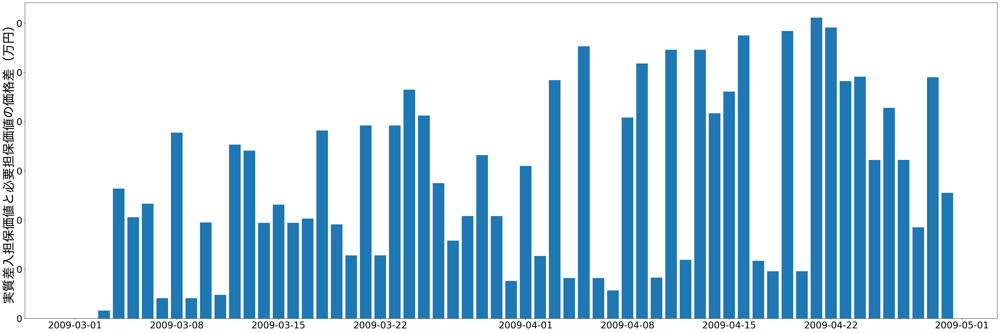

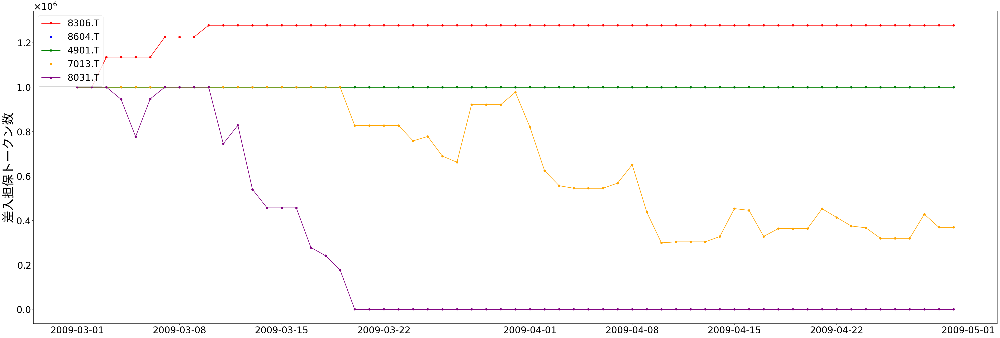

In [20]:
visualizer_s3_m2 = LogVisualizer(logs_s3_m2, './data0118/s3_m2')
# visualizer_s3_m0.plt_initial_collateral_portfolio_value()
visualizer_s3_m2.bar_collateral_price_diff()
_2 = visualizer_s3_m2.plt_collateral_num(ymin=0, ymax=3.0e+6)

In [20]:
4106850000 * 0.02

82137000.0

### model3
ベースモデル（単一トークン価格調整、マージンコール閾値設定あり）

In [17]:
simulator_s3_m3 = ExecuteAutoAdjustmentTransactionSingle(borrower_portfolio_down, lender_portfolio_jpy_3, start_date_3, end_date_3,  options=options_3)
print('Start simulation model3...')
%time logs_s3_m3 = simulator_s3_m3.execute()
print("End simulation model3!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 4106850000, 'is_usd': False, 'priority': 1}}"
2009-03-01: Price updating...
JPY: 1.0
2009-03-01: Price updating...
8306.T: 423.0
8604.T: 434.0
4901.T: 1771.0
7013.T: 810.0
8031.T: 885.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 423.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 434.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 1771.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 810.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 885.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2009-

2009-03-06: Price updating...
JPY: 1.0
2009-03-06: Price updating...
8306.T: 401.0
8604.T: 417.0
4901.T: 1763.0
7013.T: 890.0
8031.T: 842.0
adjust by single token.
from Borrower(A) to Lender(B)
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1763.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 890.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 842.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1024938, 'price': 401.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 417.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-07
2009-03-07: Price updating...
JPY: 1.0
2009-03-07: Price updating...
8306.T: 381.0
8604.T: 414.0


8306.T: 441.0
8604.T: 481.0
4901.T: 1950.0
7013.T: 940.0
8031.T: 850.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  86460000.0
price_diff:  -61138248.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1950.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 940.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 850.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 369928, 'price': 441.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 481.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-16
2009-03-16: Price updating...
JPY: 1.0
2009-03-16: Price updating...
8306.T: 441.0
8604.T: 481.0
4901.T: 1950.0
7013.T: 940.0
8031.T: 850.0
price diff is so lit

8306.T: 535.0
8604.T: 555.0
4901.T: 2250.0
7013.T: 1100.0
8031.T: 1018.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  86460000.0
price_diff:  -68134565.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2250.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1100.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1018.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': -994141, 'price': 535.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 555.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-25
2009-03-25: Price updating...
JPY: 1.0
2009-03-25: Price updating...
8306.T: 532.0
8604.T: 537.0
4901.T: 2250.0
7013.T: 1100.0
8031.T: 1071.0
adjust by sin

2009-04-02: Price updating...
8306.T: 528.0
8604.T: 563.0
4901.T: 2305.0
7013.T: 1250.0
8031.T: 1081.0
adjust by single token.
from Lender(B) to Borrower(A)
!!!!!!!!!!!!additional token issuing by Lender(B) num: 440909!!!!!!!!!!!!!!
--------------------DONE. Lender(B) adds 440909 tokens by tomorrow.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2305.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1250.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1081.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': -1218182, 'price': 528.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 563.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-03
2009-04-03: Price updating...
JPY: 1.0
2009-04-03: Price updating...
8306.T: 526.0
8604.T: 590.0
4901.T: 2365.0
7

2009-04-11: Price updating...
JPY: 1.0
2009-04-11: Price updating...
8306.T: 531.0
8604.T: 625.0
4901.T: 2615.0
7013.T: 1330.0
8031.T: 1206.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  86460000.0
price_diff:  -16115593.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2615.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1330.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1206.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': -2705997, 'price': 531.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 625.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-12
2009-04-12: Price updating...
JPY: 1.0
2009-04-12: Price updating...
8306.T: 531.0
86

2009-04-20: Price updating...
JPY: 1.0
2009-04-20: Price updating...
8306.T: 496.0
8604.T: 600.0
4901.T: 2595.0
7013.T: 1360.0
8031.T: 1192.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  86460000.0
price_diff:  -58791248.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2595.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1360.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1192.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': -2752437, 'price': 496.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 600.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-21
2009-04-21: Price updating...
JPY: 1.0
2009-04-21: Price updating...
8306.T: 491.0
86

2009-04-29: Price updating...
8306.T: 535.0
8604.T: 589.0
4901.T: 2500.0
7013.T: 1490.0
8031.T: 1038.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  86460000.0
price_diff:  -69327220.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2500.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1490.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1038.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': -2289108, 'price': 535.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 589.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-30
2009-04-30: Price updating...
JPY: 1.0
2009-04-30: Price updating...
8306.T: 535.0
8604.T: 589.0
4901.T: 2500.0
7013.T: 1490

Log Visualizer initialized.


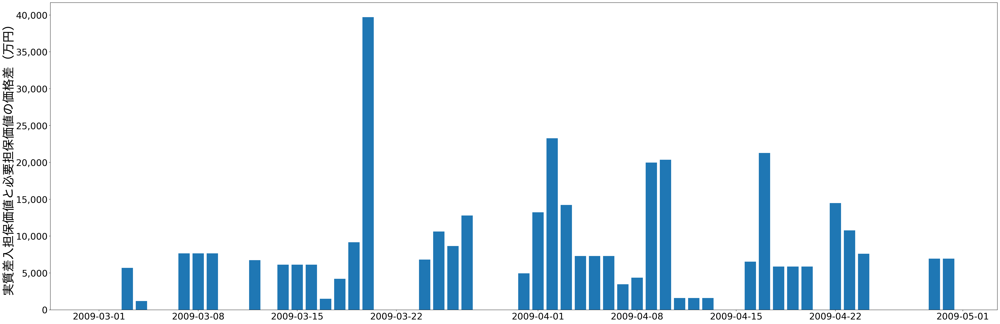

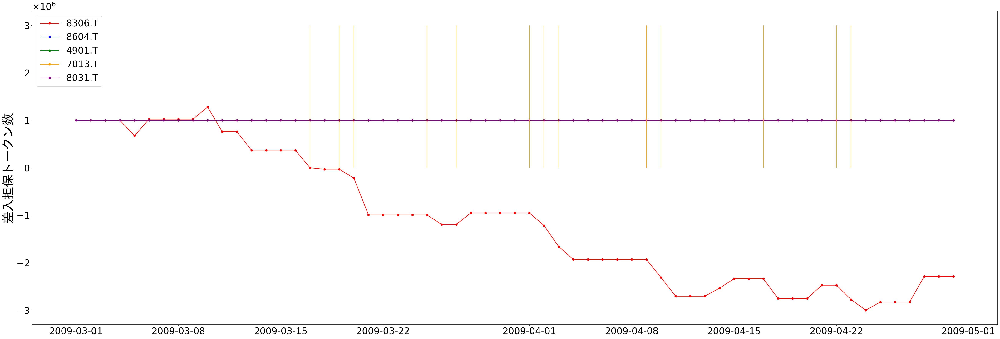

In [18]:
visualizer_s3_m3 = LogVisualizer(logs_s3_m3, './data0118/s3_m3')
# visualizer_s3_m0.plt_initial_collateral_portfolio_value()
visualizer_s3_m3.bar_collateral_price_diff()
_ = visualizer_s3_m3.plt_collateral_num(ymin=0, ymax=3.0e+6)

### model4
ベースモデル（複数トークン価格調整、マージンコール閾値設定あり）

In [23]:
simulator_s3_m4 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_down, lender_portfolio_jpy_3, start_date_3, end_date_3,  options=options_4)
print('Start simulation model4...')
%time logs_s3_m4 = simulator_s3_m4.execute()
print("End simulation model4!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 4106850000, 'is_usd': False, 'priority': 1}}"
2009-03-01: Price updating...
JPY: 1.0
2009-03-01: Price updating...
8306.T: 423.0
8604.T: 434.0
4901.T: 1771.0
7013.T: 810.0
8031.T: 885.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 423.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 434.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 1771.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 810.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 885.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2009-

2009-03-06: Price updating...
JPY: 1.0
2009-03-06: Price updating...
8306.T: 401.0
8604.T: 417.0
4901.T: 1763.0
7013.T: 890.0
8031.T: 842.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 401.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 417.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 1763.0}"
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 890.0}"
"8031.T: {'num': 157291, 'is_usd': False, 'priority': 1, 'price': 842.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1763.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 890.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 842.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1024938, 'price': 401.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 417.0, 'priority': 4}}
OK. collater

2009-03-15: Price updating...
JPY: 1.0
2009-03-15: Price updating...
8306.T: 441.0
8604.T: 481.0
4901.T: 1950.0
7013.T: 940.0
8031.T: 850.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  86460000.0
price_diff:  -70538562.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1950.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 940.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 539680, 'price': 850.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1278482, 'price': 441.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 481.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-16
2009-03-16: Price updating...
JPY: 1.0
2009-03-16: Price updating...
8306.T: 441.0
8604.T: 481.0
4901.T: 1950.0
7013.T: 940.0
8031.T: 8

{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2250.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 827324, 'price': 1100.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 0, 'price': 1018.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1278482, 'price': 535.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 555.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-25
2009-03-25: Price updating...
JPY: 1.0
2009-03-25: Price updating...
8306.T: 532.0
8604.T: 537.0
4901.T: 2250.0
7013.T: 1100.0
8031.T: 1071.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  86460000.0
price_diff:  -54208824.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2250.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 827324, 'price': 1100.0

{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2305.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 623969, 'price': 1250.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 0, 'price': 1081.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1278482, 'price': 528.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 563.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-03
2009-04-03: Price updating...
JPY: 1.0
2009-04-03: Price updating...
8306.T: 526.0
8604.T: 590.0
4901.T: 2365.0
7013.T: 1250.0
8031.T: 1133.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  86460000.0
price_diff:  -84442782.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2365.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 623969, 'price': 1250.0

{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2615.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 299238, 'price': 1330.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 0, 'price': 1206.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1278482, 'price': 531.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 625.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-12
2009-04-12: Price updating...
JPY: 1.0
2009-04-12: Price updating...
8306.T: 531.0
8604.T: 625.0
4901.T: 2615.0
7013.T: 1330.0
8031.T: 1206.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  86460000.0
price_diff:  6139518.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2615.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 299238, 'price': 1330.0, 

2009-04-21: Price updating...
JPY: 1.0
2009-04-21: Price updating...
8306.T: 491.0
8604.T: 578.0
4901.T: 2515.0
7013.T: 1330.0
8031.T: 1115.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 491.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 578.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2515.0}"
"7013.T: {'num': 671650, 'is_usd': False, 'priority': 2, 'price': 1330.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2515.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 452832, 'price': 1330.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 0, 'price': 1115.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1278482, 'price': 491.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 578.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

4901.T: 2500.0
7013.T: 1490.0
8031.T: 1038.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  86460000.0
price_diff:  -8868990.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2500.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 375088, 'price': 1490.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 0, 'price': 1038.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1278482, 'price': 535.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 589.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
Finished!!!!
CPU times: user 1min 3s, sys: 4.36 s, total: 1min 7s
Wall time: 7min 11s
End simulation model4!!!


Log Visualizer initialized.


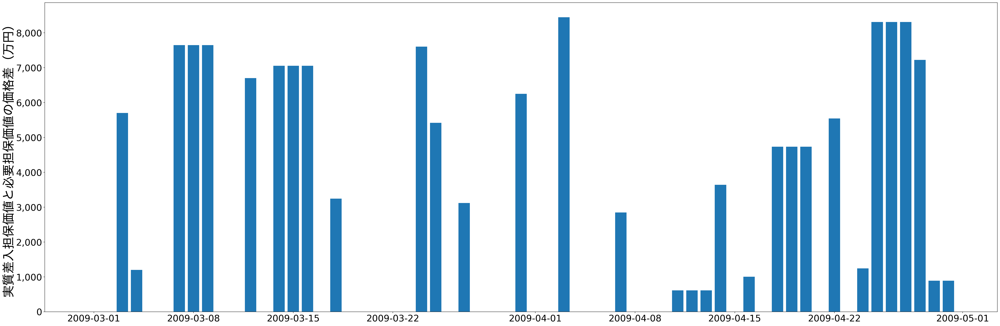

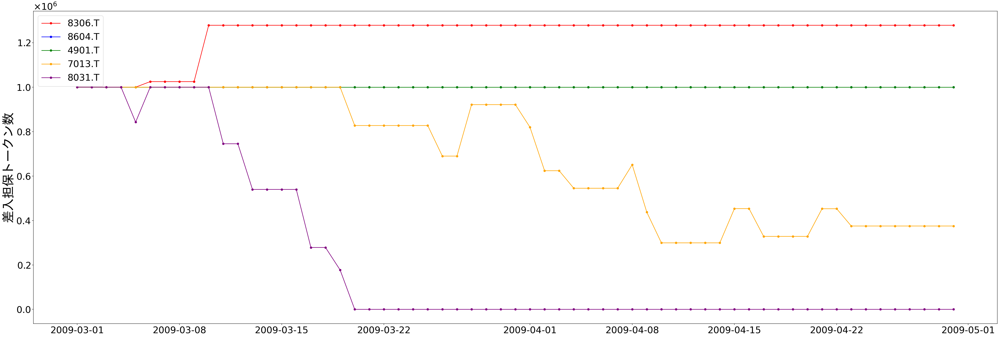

In [24]:
visualizer_s3_m4 = LogVisualizer(logs_s3_m4, './data0118/s3_m4')
# visualizer_s3_m0.plt_initial_collateral_portfolio_value()
visualizer_s3_m4.bar_collateral_price_diff()
_ = visualizer_s3_m4.plt_collateral_num(ymin=0, ymax=3.0e+6)

## シナリオ4: 乱高下

In [36]:
# シミュレーションの日付設定
start_date_4 = date(2008, 11, 1)
end_date_4 = date(2009, 1, 1)

### model0
現行手続きモデル

In [37]:
simulator_s4_m0 = ExecuteAutoAdjustmentTransactionSingle(borrower_portfolio_down, lender_portfolio_jpy_4, start_date_4, end_date_4,  options=options_0)
print('Start simulation model0...')
%time logs_s4_m0 = simulator_s4_m0.execute()
print("End simulation model0!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 5699050000, 'is_usd': False, 'priority': 1}}"
2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 627.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 927.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 2310.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1210.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 925.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
200

2008-11-09: Price updating...
JPY: 1.0
2008-11-09: Price updating...
8306.T: 652.0
8604.T: 975.0
4901.T: 2390.0
7013.T: 1320.0
8031.T: 991.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-10
2008-11-10: Price updating...
JPY: 1.0
2008-11-10: Price updating...
8306.T: 652.0
8604.T: 975.0
4901.T: 2390.0
7013.T: 1320.0
8031.T: 991.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
200

2008-11-26: Price updating...
JPY: 1.0
2008-11-26: Price updating...
8306.T: 498.0
8604.T: 646.0
4901.T: 2255.0
7013.T: 1140.0
8031.T: 725.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-27
2008-11-27: Price updating...
JPY: 1.0
2008-11-27: Price updating...
8306.T: 518.0
8604.T: 680.0
4901.T: 2330.0
7013.T: 1120.0
8031.T: 781.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
200

2008-12-13: Price updating...
JPY: 1.0
2008-12-13: Price updating...
8306.T: 517.0
8604.T: 670.0
4901.T: 2110.0
7013.T: 1090.0
8031.T: 851.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-14
2008-12-14: Price updating...
JPY: 1.0
2008-12-14: Price updating...
8306.T: 517.0
8604.T: 670.0
4901.T: 2110.0
7013.T: 1090.0
8031.T: 851.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
200

adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-30
2008-12-30: Price updating...
JPY: 1.0
2008-12-30: Price updating...
8306.T: 549.0
8604.T: 729.0
4901.T: 1950.0
7013.T: 1130.0
8031.T: 901.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-31
2008-12-31: Price updating...
JPY: 1.0
2008-12-31: Price updating...
8306.T: 571.0
8604.T: 766.0
4901.T: 2000.0
7013.T: 1200.0
8031.T

Log Visualizer initialized.


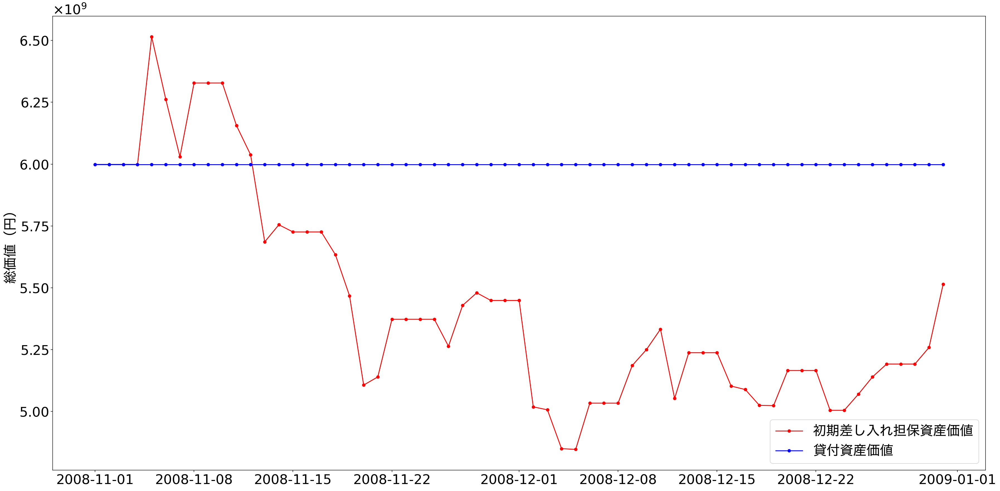

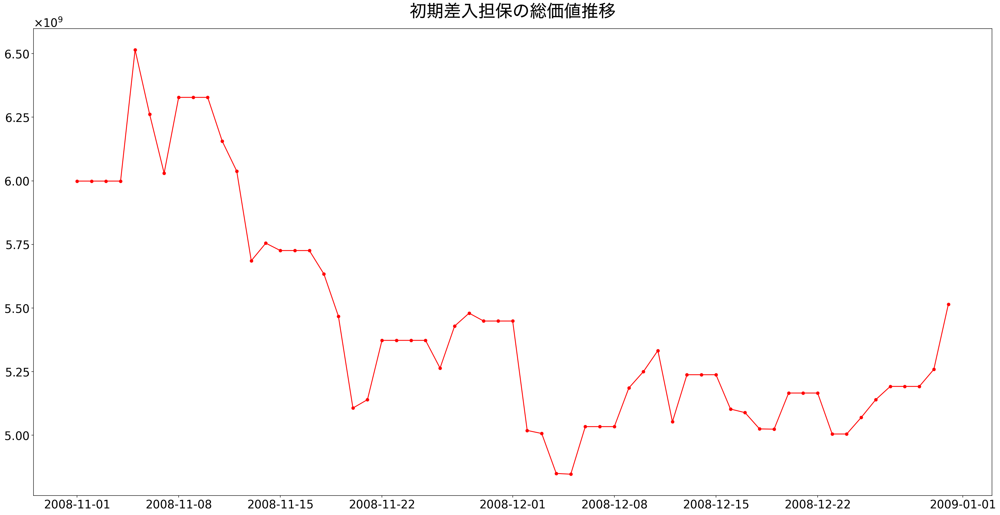

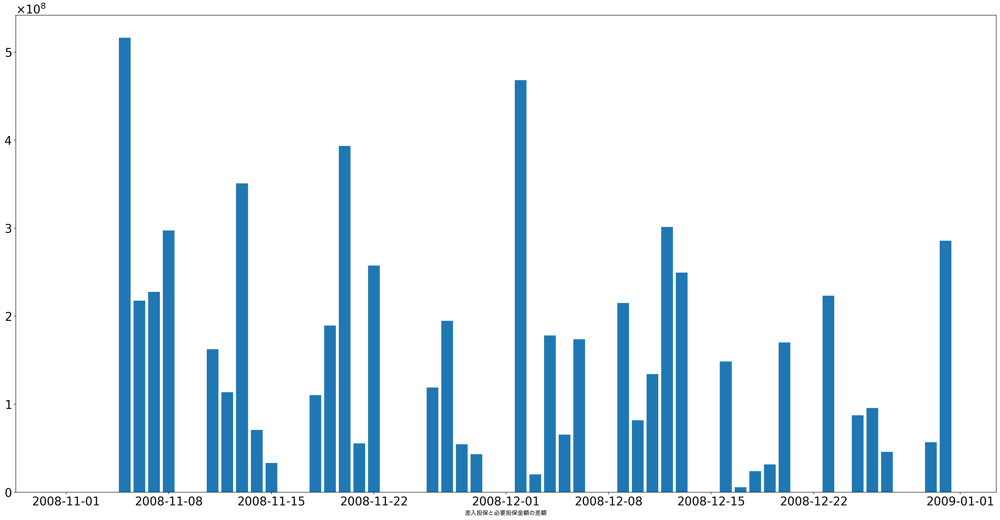

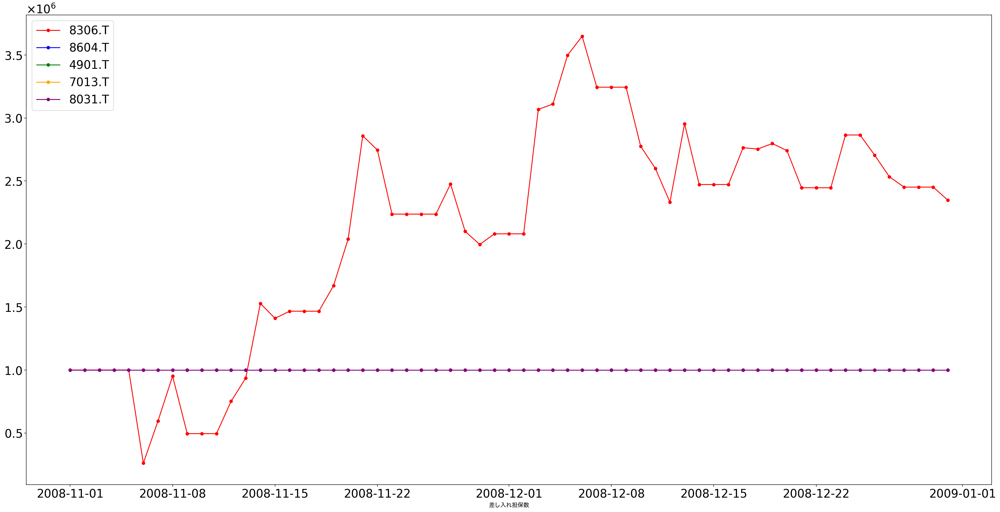

In [38]:
visualizer_s4_m0 = LogVisualizer(logs_s4_m0, './data0118/s4_m0')
visualizer_s4_m0.compare_initial_collateral_portfolio()
visualizer_s4_m0.plt_initial_collateral_portfolio_value()
visualizer_s4_m0.bar_collateral_price_diff()
a = visualizer_s4_m0.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model1
ベースモデル（単一トークン価格調整、マージンコール閾値設定なし）

In [39]:
simulator_s4_m1 = ExecuteAutoAdjustmentTransactionSingle(borrower_portfolio_down, lender_portfolio_jpy_4, start_date_4, end_date_4,  options=options_1)
print('Start simulation model1...')
%time logs_s4_m1 = simulator_s4_m1.execute()
print("End simulation model1!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 5699050000, 'is_usd': False, 'priority': 1}}"
2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 627.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 927.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 2310.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1210.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 925.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
200

2008-11-06: Price updating...
JPY: 1.0
2008-11-06: Price updating...
8306.T: 650.0
8604.T: 948.0
4901.T: 2350.0
7013.T: 1280.0
8031.T: 1034.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1034.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 595385, 'price': 650.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 948.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-07
2008-11-07: Price updating...
JPY: 1.0
2008-11-07: Price updating...
8306.T: 639.0
8604.T: 948.0
4901.T: 2230

--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2270.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1210.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 824.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1466667, 'price': 585.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 837.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-16
2008-11-16: Price updating...
JPY: 1.0
2008-11-16: Price updating...
8306.T: 585.0
8604.T: 837.0
4901.T: 2270.0
7013.T: 1210.0
8031.T: 824.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 10000

2008-11-25: Price updating...
JPY: 1.0
2008-11-25: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 2280.0
7013.T: 1140.0
8031.T: 754.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2280.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1140.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 754.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2237155, 'price': 506.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 693.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-26
2008-11-26: Price updating...
JPY: 1.0
2008-11-26: Price updating...
8306.T: 498.0
8604.T: 646.0
4901.T: 2255.

--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2025.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1070.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 708.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3497827, 'price': 460.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 587.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-05
2008-12-05: Price updating...
JPY: 1.0
2008-12-05: Price updating...
8306.T: 435.0
8604.T: 611.0
4901.T: 2070.0
7013.T: 1040.0
8031.T: 691.0
adjust by single token.
from Borrower(A) to Lender(B)
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': Fals

2008-12-14: Price updating...
JPY: 1.0
2008-12-14: Price updating...
8306.T: 517.0
8604.T: 670.0
4901.T: 2110.0
7013.T: 1090.0
8031.T: 851.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1090.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 851.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2471954, 'price': 517.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 670.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-15
2008-12-15: Price updating...
JPY: 1.0
2008-12-15: Price updating...
8306.T: 517.0
8604.T: 670.0
4901.T: 2110.

--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1896.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1070.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 795.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2864916, 'price': 533.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 711.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-24
2008-12-24: Price updating...
JPY: 1.0
2008-12-24: Price updating...
8306.T: 533.0
8604.T: 711.0
4901.T: 1896.0
7013.T: 1070.0
8031.T: 795.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 10000

Log Visualizer initialized.


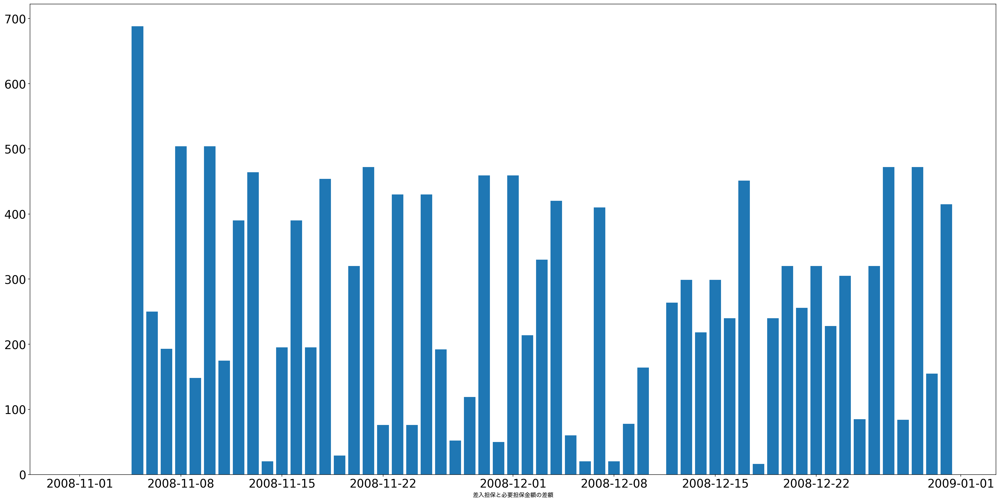

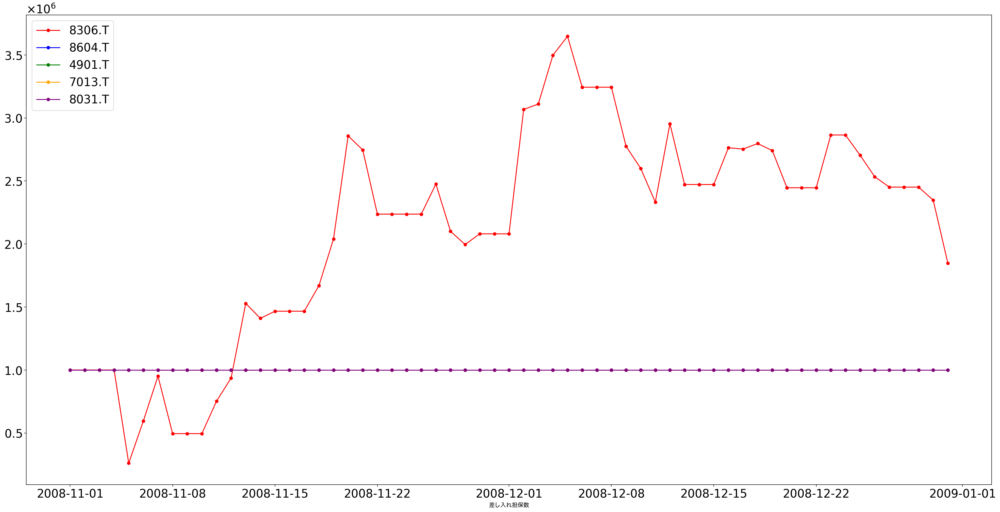

In [40]:
visualizer_s4_m1 = LogVisualizer(logs_s4_m1, './data0118/s4_m1')
# visualizer_s1_m0.plt_initial_collateral_portfolio_value()
visualizer_s4_m1.bar_collateral_price_diff()
_ = visualizer_s4_m1.plt_collateral_num(ymin=0, ymax=3.0e+6)

### model2
ベースモデル（複数トークン価格調整、マージンコール閾値設定なし）

In [41]:
simulator_s4_m2 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_down, lender_portfolio_jpy_4, start_date_4, end_date_4,  options=options_2)
print('Start simulation model2...')
%time logs_s4_m2 = simulator_s4_m2.execute()
print("End simulation model2!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 5699050000, 'is_usd': False, 'priority': 1}}"
2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 627.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 927.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 2310.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1210.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 925.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
200

2008-11-06: Price updating...
JPY: 1.0
2008-11-06: Price updating...
8306.T: 650.0
8604.T: 948.0
4901.T: 2350.0
7013.T: 1280.0
8031.T: 1034.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 650.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 948.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2350.0}"
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 1280.0}"
"8031.T: {'num': 503415, 'is_usd': False, 'priority': 1, 'price': 1034.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 745648, 'price': 1034.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1000000, 'price': 650.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 948.0, 'priority': 4}}
OK. collateral is move

{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2210.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1170.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 859.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1528717, 'price': 592.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 855.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-14
2008-11-14: Price updating...
JPY: 1.0
2008-11-14: Price updating...
8306.T: 595.0
8604.T: 861.0
4901.T: 2265.0
7013.T: 1180.0
8031.T: 854.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 1000000, 'is_usd': False, 'price': 854.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2265.0, 'priority': 3},
 '7013.T': {'is_usd': Fal

2008-11-21: Price updating...
JPY: 1.0
2008-11-21: Price updating...
8306.T: 492.0
8604.T: 645.0
4901.T: 2110.0
7013.T: 1140.0
8031.T: 753.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 1000000, 'is_usd': False, 'price': 753.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1140.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 926559, 'price': 753.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2858334, 'price': 492.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 645.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-22
2008-11-22: Price updating...
JPY: 1.0
2008-11-22: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T:

{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2300.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1110.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 535339, 'price': 852.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2858334, 'price': 509.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 678.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-30
2008-11-30: Price updating...
JPY: 1.0
2008-11-30: Price updating...
8306.T: 509.0
8604.T: 678.0
4901.T: 2300.0
7013.T: 1110.0
8031.T: 852.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 535339, 'is_usd': False, 'price': 852.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2300.0, 'priority': 3},
 '7013.T': {'is_usd': False

2008-12-07: Price updating...
JPY: 1.0
2008-12-07: Price updating...
8306.T: 430.0
8604.T: 631.0
4901.T: 2175.0
7013.T: 1060.0
8031.T: 738.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 430.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 631.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2175.0}"
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 1060.0}"
"8031.T: {'num': 235446, 'is_usd': False, 'priority': 1, 'price': 738.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2175.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1060.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 764555, 'price': 738.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3648276, 'price': 430.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 631.0, 'priority': 4}}
OK. collateral is moved.


{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1090.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 285359, 'price': 851.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3648276, 'price': 517.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 670.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-16
2008-12-16: Price updating...
JPY: 1.0
2008-12-16: Price updating...
8306.T: 508.0
8604.T: 641.0
4901.T: 2020.0
7013.T: 1100.0
8031.T: 834.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 508.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 641.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2020.0}"
"7013.T: {'num': 0, 'is_usd': False, 

{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1896.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1070.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 474804, 'price': 795.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3648276, 'price': 533.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 711.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-24
2008-12-24: Price updating...
JPY: 1.0
2008-12-24: Price updating...
8306.T: 533.0
8604.T: 711.0
4901.T: 1896.0
7013.T: 1070.0
8031.T: 795.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 474804, 'is_usd': False, 'price': 795.0, 'priority': 1}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1896.0, 'priority': 3},
 '7013.T': {'is_usd': False

Log Visualizer initialized.


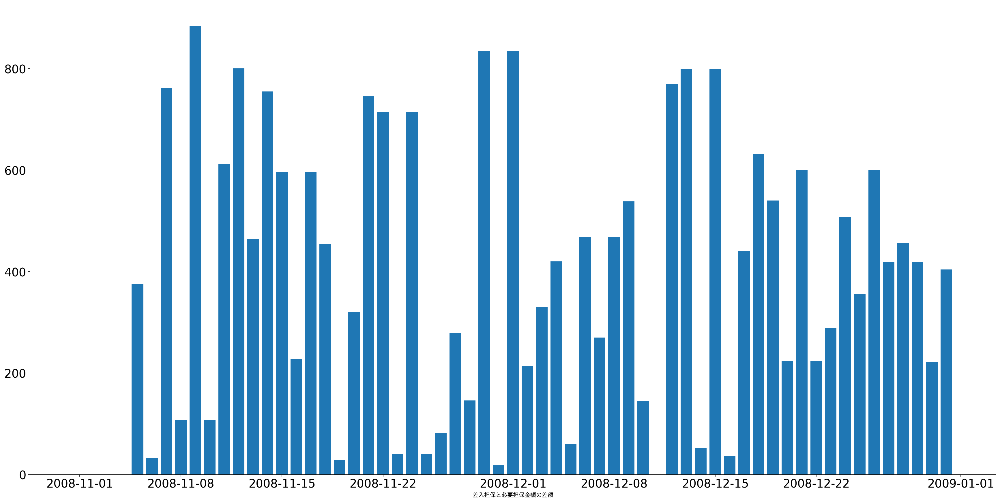

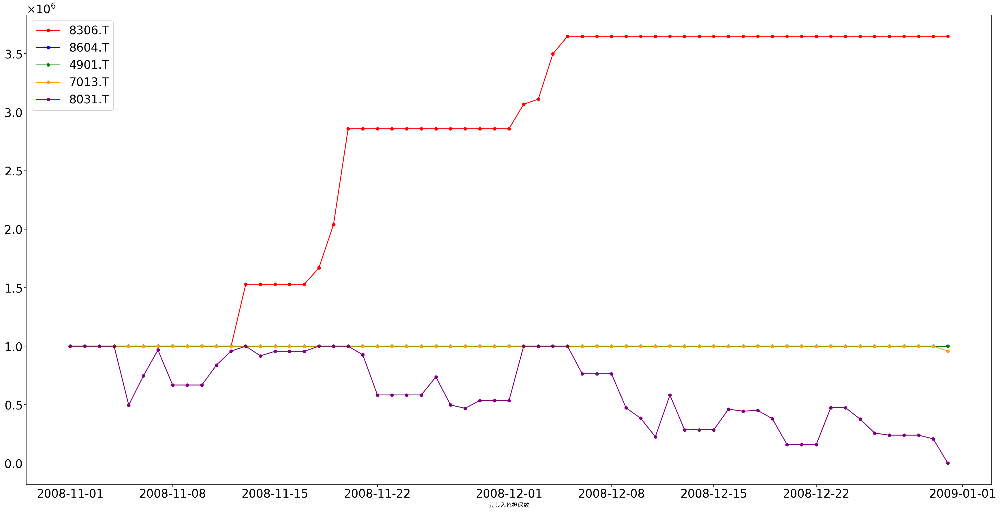

In [42]:
visualizer_s4_m2 = LogVisualizer(logs_s4_m2, './data0118/s4_m2')
# visualizer_s1_m0.plt_initial_collateral_portfolio_value()
visualizer_s4_m2.bar_collateral_price_diff()
_ = visualizer_s4_m2.plt_collateral_num(ymin=0, ymax=3.0e+6)

### model3
ベースモデル（単一トークン価格調整、マージンコール閾値設定あり）

In [43]:
simulator_s4_m3 = ExecuteAutoAdjustmentTransactionSingle(borrower_portfolio_down, lender_portfolio_jpy_4, start_date_4, end_date_4,  options=options_3)
print('Start simulation model3...')
%time logs_s4_m3 = simulator_s4_m3.execute()
print("End simulation model3!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 5699050000, 'is_usd': False, 'priority': 1}}"
2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 627.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 927.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 2310.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1210.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 925.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
200

2008-11-06: Price updating...
JPY: 1.0
2008-11-06: Price updating...
8306.T: 650.0
8604.T: 948.0
4901.T: 2350.0
7013.T: 1280.0
8031.T: 1034.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1034.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 595385, 'price': 650.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 948.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-07
2008-11-07: Price updating...
JPY: 1.0
2008-11-07: Price updating...
8306.T: 639.0
8604.T: 948.0
4901.T: 2230

4901.T: 2270.0
7013.T: 1210.0
8031.T: 824.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  119980000.0
price_diff:  -36299445.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2270.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1210.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 824.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1528717, 'price': 585.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 837.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-16
2008-11-16: Price updating...
JPY: 1.0
2008-11-16: Price updating...
8306.T: 585.0
8604.T: 837.0
4901.T: 2270.0
7013.T: 1210.0
8031.T: 824.0
price diff is so little that auto margin ca

8031.T: 754.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  119980000.0
price_diff:  76.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2280.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1140.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 754.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2237154, 'price': 506.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 693.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-25
2008-11-25: Price updating...
JPY: 1.0
2008-11-25: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 2280.0
7013.T: 1140.0
8031.T: 754.0
price diff is so little that auto margin call is cancelled.
margincall threshold

--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2090.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1070.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 759.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3067511, 'price': 470.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 618.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-04
2008-12-04: Price updating...
JPY: 1.0
2008-12-04: Price updating...
8306.T: 460.0
8604.T: 587.0
4901.T: 2025.0
7013.T: 1070.0
8031.T: 708.0
adjust by single token.
from Borrower(A) to Lender(B)
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': Fals

2008-12-13: Price updating...
JPY: 1.0
2008-12-13: Price updating...
8306.T: 517.0
8604.T: 670.0
4901.T: 2110.0
7013.T: 1090.0
8031.T: 851.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1090.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 851.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2471953, 'price': 517.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 670.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-14
2008-12-14: Price updating...
JPY: 1.0
2008-12-14: Price updating...
8306.T: 517.0
8604.T: 670.0
4901.T: 2110.

8306.T: 576.0
8604.T: 752.0
4901.T: 1914.0
7013.T: 1100.0
8031.T: 824.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  119980000.0
price_diff:  320.0
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1914.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1100.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 824.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2446180, 'price': 576.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 752.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-23
2008-12-23: Price updating...
JPY: 1.0
2008-12-23: Price updating...
8306.T: 533.0
8604.T: 711.0
4901.T: 1896.0
7013.T: 1070.0
8031.T: 795.0
adjust by single toke

7013.T: 1200.0
8031.T: 978.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2000.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1200.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 978.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1847635, 'price': 571.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 766.0, 'priority': 4}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
Finished!!!!
CPU times: user 1min 1s, sys: 4.44 s, total: 1min 5s
Wall time: 7min 3s
End simulation model3!!!


Log Visualizer initialized.


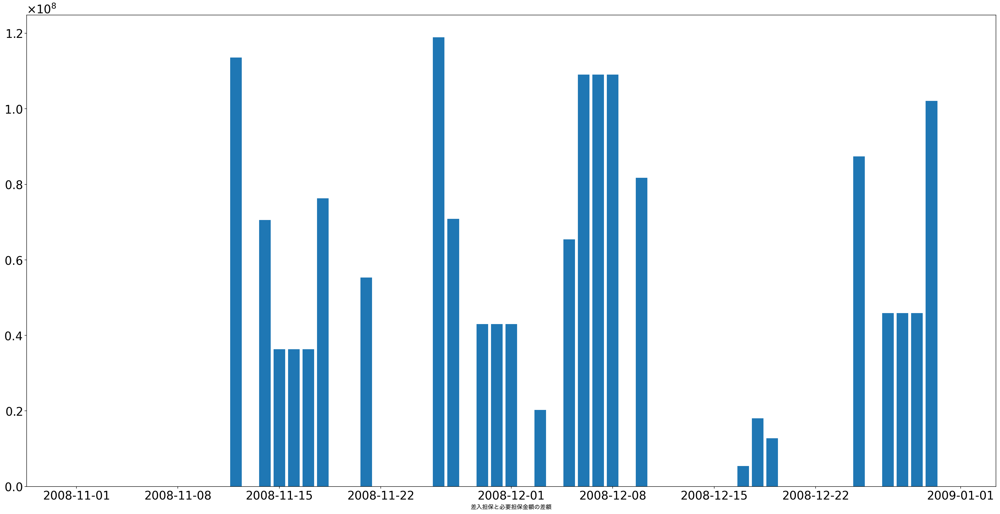

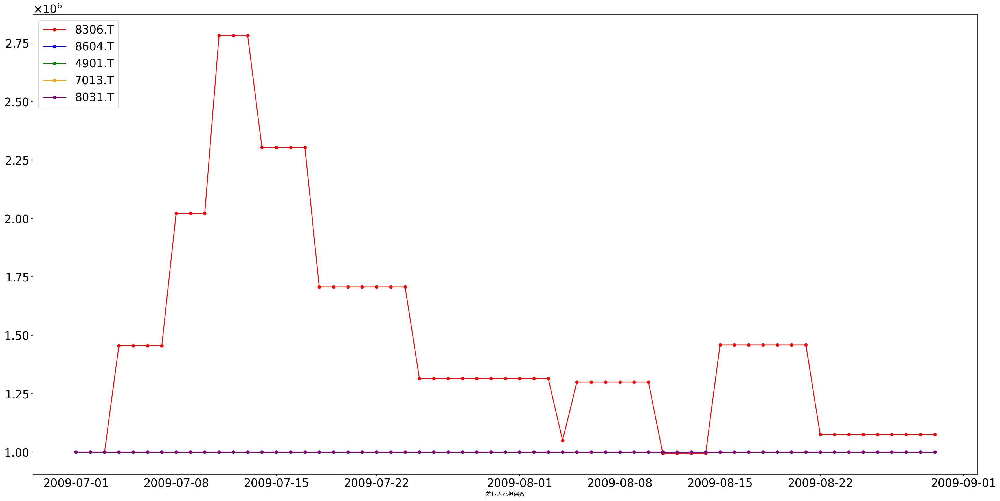

In [44]:
visualizer_s4_m3 = LogVisualizer(logs_s4_m3, './data0118/s4_m3')
# visualizer_s1_m0.plt_initial_collateral_portfolio_value()
visualizer_s4_m3.bar_collateral_price_diff()
_ = visualizer_s1_m3.plt_collateral_num(ymin=0, ymax=3.0e+6)

### model4
ベースモデル（複数トークン価格調整、マージンコール閾値設定あり）

In [45]:
simulator_s4_m4 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_down, lender_portfolio_jpy_4, start_date_4, end_date_4,  options=options_4)
print('Start simulation model4...')
%time logs_s4_m4 = simulator_s4_m4.execute()
print("End simulation model4!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 5699050000, 'is_usd': False, 'priority': 1}}"
2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 627.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 927.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 2310.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1210.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 925.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
200

2008-11-06: Price updating...
JPY: 1.0
2008-11-06: Price updating...
8306.T: 650.0
8604.T: 948.0
4901.T: 2350.0
7013.T: 1280.0
8031.T: 1034.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 650.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 948.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2350.0}"
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 1280.0}"
"8031.T: {'num': 503415, 'is_usd': False, 'priority': 1, 'price': 1034.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 745648, 'price': 1034.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1000000, 'price': 650.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 948.0, 'priority': 4}}
OK. collateral is move

2008-11-14: Price updating...
JPY: 1.0
2008-11-14: Price updating...
8306.T: 595.0
8604.T: 861.0
4901.T: 2265.0
7013.T: 1180.0
8031.T: 854.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  119980000.0
price_diff:  -70586615.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2265.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1180.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 854.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1528717, 'price': 595.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 861.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-15
2008-11-15: Price updating...
JPY: 1.0
2008-11-15: Price updating...
8306.T: 585.0
8604.T: 837.0
4901.T: 2270.0
7013.T: 1210.0
8031

2008-11-23: Price updating...
JPY: 1.0
2008-11-23: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 2280.0
7013.T: 1140.0
8031.T: 754.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  119980000.0
price_diff:  714.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2280.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1140.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 583133, 'price': 754.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2858334, 'price': 506.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 693.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-24
2008-11-24: Price updating...
JPY: 1.0
2008-11-24: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 2280.0
7013.T: 1140.0
8031.T: 754

{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2095.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1070.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 768.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3067511, 'price': 474.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 612.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-03
2008-12-03: Price updating...
JPY: 1.0
2008-12-03: Price updating...
8306.T: 470.0
8604.T: 618.0
4901.T: 2090.0
7013.T: 1070.0
8031.T: 759.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  119980000.0
price_diff:  20269830.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2090.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 

2008-12-12: Price updating...
JPY: 1.0
2008-12-12: Price updating...
8306.T: 484.0
8604.T: 666.0
4901.T: 2020.0
7013.T: 1080.0
8031.T: 803.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 484.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 666.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2020.0}"
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 1080.0}"
"8031.T: {'num': 685781, 'is_usd': False, 'priority': 1, 'price': 803.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2020.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1080.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 672543, 'price': 803.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3497827, 'price': 484.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 666.0, 'priority': 4}}
OK. collateral is moved.


2008-12-21: Price updating...
JPY: 1.0
2008-12-21: Price updating...
8306.T: 576.0
8604.T: 752.0
4901.T: 1914.0
7013.T: 1100.0
8031.T: 824.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  119980000.0
price_diff:  416.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1914.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1100.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 264868, 'price': 824.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3497827, 'price': 576.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 752.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-22
2008-12-22: Price updating...
JPY: 1.0
2008-12-22: Price updating...
8306.T: 576.0
8604.T: 752.0
4901.T: 1914.0
7013.T: 1100.0
8031.T: 824

8306.T: 549.0
8604.T: 729.0
4901.T: 1950.0
7013.T: 1130.0
8031.T: 901.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  119980000.0
price_diff:  -52325324.0
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1950.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1130.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 357401, 'price': 901.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3497827, 'price': 549.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 729.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-31
2008-12-31: Price updating...
JPY: 1.0
2008-12-31: Price updating...
8306.T: 571.0
8604.T: 766.0
4901.T: 2000.0
7013.T: 1200.0
8031.T: 978.0
from Lender(B) to Borrower(A)
"8031.T: {'num': 357401, 'is_u

Log Visualizer initialized.


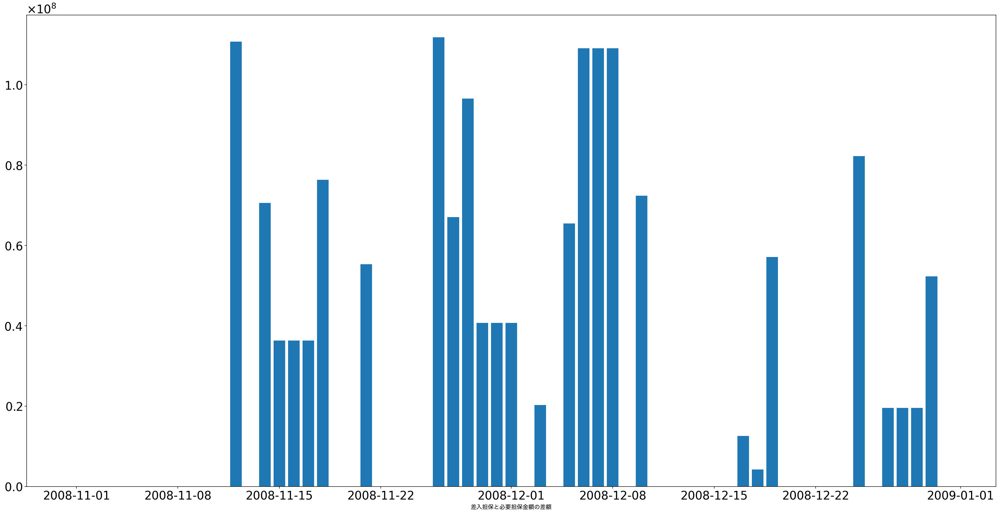

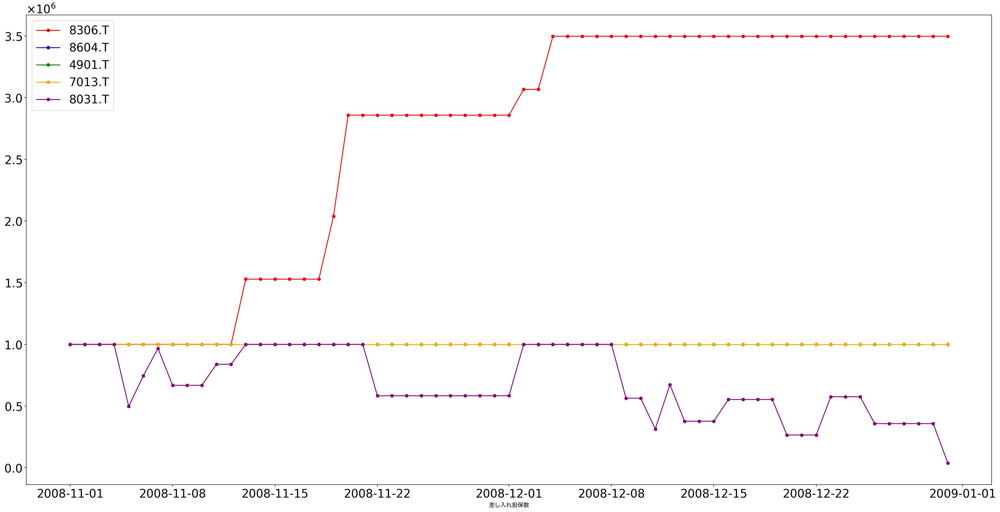

In [46]:
visualizer_s4_m4 = LogVisualizer(logs_s4_m4, './data0118/s4_m4')
# visualizer_s1_m0.plt_initial_collateral_portfolio_value()
visualizer_s4_m4.bar_collateral_price_diff()
_= visualizer_s4_m4.plt_collateral_num(ymin=0, ymax=3.0e+6)

# Visualization

## 概観

### リーマンショック前後

In [ ]:
saved_logs_0 = np.load('./data0117/all_term.npy', allow_pickle=True).item()
visualizer_0 = LogVisualizer(saved_logs_0)
visualizer_0.compare_initial_collateral_portfolio()
# visualizer_0.plt_initial_collateral_portfolio_value()
visualizer_0.bar_collateral_price_diff()
visualizer_0.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)
result_0 = visualizer_0.calc_price_diff_result()
# result_0

In [ ]:
saved_logs_0['collateral_portfolio'][:10]
price_list = [_p['8306.T']['price'] for _p in saved_logs_0['collateral_portfolio'][:10]]
init_price = price_list[0]
list(np.array(price_list) / init_price)

### シナリオ1

#### model0

In [ ]:
saved_logs_s1_m0 = np.load('./data0118/s1_m0.npy', allow_pickle=True).item()
visualizer_s1_m0 = LogVisualizer(saved_logs_s1_m0)
visualizer_s1_m0.compare_initial_collateral_portfolio()
visualizer_s1_m0.bar_collateral_price_diff()
visualizer_s1_m0.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)
result_s1_m0 = visualizer_s1_m0.calc_price_diff_result()

result_s1_m0

saved_logs_s1_m0['lender_additional_issue'].count(True)
saved_logs_s1_m0['has_done_margincall'].count(True)

#### model1

In [ ]:
saved_logs_s1_m1 = np.load('./data0118/s1_m1.npy', allow_pickle=True).item()
visualizer_s1_m1 = LogVisualizer(saved_logs_s1_m1)
# visualizer_s1_m1.plt_initial_collateral_portfolio_value()
visualizer_s1_m1.bar_collateral_price_diff()
visualizer_s1_m1.plt_collateral_num(ymin=0, ymax=7.0e+6)
result_s1_m1 = visualizer_s1_m1.calc_price_diff_result()
result_s1_m1

saved_logs_s1_m1['lender_additional_issue'].count(True)
saved_logs_s1_m1['has_done_margincall'].count(True)

#### model2

In [ ]:
saved_logs_s1_m2 = np.load('./data0118/s1_m2.npy', allow_pickle=True).item()
visualizer_s1_m2 = LogVisualizer(saved_logs_s1_m2)
# visualizer_s1_m2.plt_initial_collateral_portfolio_value()
visualizer_s1_m2.bar_collateral_price_diff()
visualizer_s1_m2.plt_collateral_num(ymin=0, ymax=7.0e+6)
result_s1_m2 = visualizer_s1_m2.calc_price_diff_result()
result_s1_m2

#### model3

In [ ]:
saved_logs_s1_m3 = np.load('./data0118/s1_m3.npy', allow_pickle=True).item()
visualizer_s1_m3 = LogVisualizer(saved_logs_s1_m3)
# visualizer_s1_m3.plt_initial_collateral_portfolio_value()
visualizer_s1_m3.bar_collateral_price_diff()
visualizer_s1_m3.plt_collateral_num(ymin=0, ymax=7.0e+6)
result_s1_m3 = visualizer_s1_m3.calc_price_diff_result()
result_s1_m3

#### model4

In [ ]:
saved_logs_s1_m4 = np.load('./data0118/s1_m4.npy', allow_pickle=True).item()
visualizer_s1_m4 = LogVisualizer(saved_logs_s1_m4)
# visualizer_s1_m4.plt_initial_collateral_portfolio_value()
visualizer_s1_m4.bar_collateral_price_diff()
visualizer_s1_m4.plt_collateral_num(ymin=0, ymax=7.0e+6)
result_s1_m4 = visualizer_s1_m4.calc_price_diff_result()
result_s1_m4

### シナリオ2

#### model0

In [ ]:
saved_logs_s2_m0 = np.load('./data0118/s2_m0.npy', allow_pickle=True).item()
visualizer_s2_m0 = LogVisualizer(saved_logs_s2_m0)
visualizer_s2_m0.compare_initial_collateral_portfolio()
visualizer_s2_m0.bar_collateral_price_diff()
visualizer_s2_m0.plt_collateral_num(ymin=0, ymax=1.5e+6, show_additional_issue=False)
result_s2_m0 = visualizer_s2_m0.calc_price_diff_result()
result_s2_m0

#### model1

In [ ]:
saved_logs_s2_m1 = np.load('./data0118/s2_m1.npy', allow_pickle=True).item()
visualizer_s2_m1 = LogVisualizer(saved_logs_s2_m1)
# visualizer_s2_m1.plt_initial_collateral_portfolio_value()
visualizer_s2_m1.bar_collateral_price_diff()
visualizer_s2_m1.plt_collateral_num(ymin=-3.0e+6, ymax=1.5e+6)
result_s2_m1 = visualizer_s2_m1.calc_price_diff_result()
result_s2_m1

#### model2

In [ ]:
saved_logs_s2_m2 = np.load('./data0118/s2_m2.npy', allow_pickle=True).item()
visualizer_s2_m2 = LogVisualizer(saved_logs_s2_m2)
# visualizer_s2_m2.plt_initial_collateral_portfolio_value()
visualizer_s2_m2.bar_collateral_price_diff()
visualizer_s2_m2.plt_collateral_num(ymin=0, ymax=1.5e+6)
result_s2_m2 = visualizer_s2_m2.calc_price_diff_result()
result_s2_m2

#### model3

In [ ]:
saved_logs_s2_m3 = np.load('./data0118/s2_m3.npy', allow_pickle=True).item()
visualizer_s2_m3 = LogVisualizer(saved_logs_s2_m3)
# visualizer_s2_m3.plt_initial_collateral_portfolio_value()
visualizer_s2_m3.bar_collateral_price_diff()
visualizer_s2_m3.plt_collateral_num(ymin=-3.0e+6, ymax=1.5e+6)
result_s2_m3 = visualizer_s2_m3.calc_price_diff_result()
result_s2_m3

#### model4

In [ ]:
saved_logs_s2_m4 = np.load('./data0118/s2_m4.npy', allow_pickle=True).item()
visualizer_s2_m4 = LogVisualizer(saved_logs_s2_m4)
# visualizer_s2_m4.plt_initial_collateral_portfolio_value()
visualizer_s2_m4.bar_collateral_price_diff()
visualizer_s2_m4.plt_collateral_num(ymin=0, ymax=1.5e+6)
result_s2_m4 = visualizer_s2_m4.calc_price_diff_result()
result_s2_m4

### シナリオ3

#### model0

In [ ]:
saved_logs_s3_m0 = np.load('./data0118/s3_m0.npy', allow_pickle=True).item()
visualizer_s3_m0 = LogVisualizer(saved_logs_s3_m0)
visualizer_s3_m0.compare_initial_collateral_portfolio()
visualizer_s3_m0.bar_collateral_price_diff()
visualizer_s3_m0.plt_collateral_num(ymin=0, ymax=3.0e+6, show_additional_issue=False)
result_s3_m0 = visualizer_s3_m0.calc_price_diff_result()
result_s3_m0

#### model1

In [ ]:
saved_logs_s3_m1 = np.load('./data0118/s3_m1.npy', allow_pickle=True).item()
visualizer_s3_m1 = LogVisualizer(saved_logs_s3_m1)
# visualizer_s3_m1.plt_initial_collateral_portfolio_value()
visualizer_s3_m1.bar_collateral_price_diff()
visualizer_s3_m1.plt_collateral_num(ymin=-0.5e+6, ymax=3.0e+6)
result_s3_m1 = visualizer_s3_m1.calc_price_diff_result()
result_s3_m1

#### model2

In [ ]:
saved_logs_s3_m2 = np.load('./data0118/s3_m2.npy', allow_pickle=True).item()
visualizer_s3_m2 = LogVisualizer(saved_logs_s3_m2)
# visualizer_s3_m2.plt_initial_collateral_portfolio_value()
visualizer_s3_m2.bar_collateral_price_diff()
visualizer_s3_m2.plt_collateral_num(ymin=0, ymax=3.0e+6)
result_s3_m2 = visualizer_s3_m2.calc_price_diff_result()
result_s3_m2

#### model3

In [ ]:
saved_logs_s3_m3 = np.load('./data0118/s3_m3.npy', allow_pickle=True).item()
visualizer_s3_m3 = LogVisualizer(saved_logs_s3_m3)
# visualizer_s3_m3.plt_initial_collateral_portfolio_value()
visualizer_s3_m3.bar_collateral_price_diff()
visualizer_s3_m3.plt_collateral_num(ymin=-0.5e+6, ymax=3.0e+6)
result_s3_m3 = visualizer_s3_m3.calc_price_diff_result()
result_s3_m3

#### model4

In [ ]:
saved_logs_s3_m4 = np.load('./data0118/s3_m4.npy', allow_pickle=True).item()
visualizer_s3_m4 = LogVisualizer(saved_logs_s3_m4)
# visualizer_s3_m4.plt_initial_collateral_portfolio_value()
visualizer_s3_m4.bar_collateral_price_diff()
visualizer_s3_m4.plt_collateral_num(ymin=0, ymax=3.0e+6)
result_s3_m4 = visualizer_s3_m4.calc_price_diff_result()
result_s3_m4

## シナリオ4

#### model0

In [ ]:
saved_logs_s4_m0 = np.load('./data0118/s4_m0.npy', allow_pickle=True).item()
visualizer_s4_m0 = LogVisualizer(saved_logs_s4_m0)
visualizer_s4_m0.compare_initial_collateral_portfolio()
visualizer_s4_m0.bar_collateral_price_diff()
visualizer_s4_m0.plt_collateral_num(ymin=0, ymax=3.0e+6, show_additional_issue=False)
result_s4_m0 = visualizer_s4_m0.calc_price_diff_result()
result_s4_m0

#### model1

In [ ]:
saved_logs_s4_m1 = np.load('./data0118/s4_m1.npy', allow_pickle=True).item()
visualizer_s4_m1 = LogVisualizer(saved_logs_s4_m1)
visualizer_s4_m1.bar_collateral_price_diff()
visualizer_s4_m1.plt_collateral_num(ymin=0, ymax=3.0e+6)
result_s4_m1 = visualizer_s4_m1.calc_price_diff_result()
result_s4_m1

#### model2

In [ ]:
saved_logs_s4_m2 = np.load('./data0118/s4_m2.npy', allow_pickle=True).item()
visualizer_s4_m2 = LogVisualizer(saved_logs_s4_m2)
visualizer_s4_m2.bar_collateral_price_diff()
visualizer_s4_m2.plt_collateral_num(ymin=0, ymax=3.0e+6)
result_s4_m2 = visualizer_s4_m2.calc_price_diff_result()
result_s4_m2

#### model3

In [ ]:
saved_logs_s4_m3 = np.load('./data0118/s4_m3.npy', allow_pickle=True).item()
visualizer_s4_m3 = LogVisualizer(saved_logs_s4_m3)
visualizer_s4_m3.bar_collateral_price_diff()
visualizer_s4_m3.plt_collateral_num(ymin=0, ymax=3.0e+6)
result_s4_m3 = visualizer_s4_m3.calc_price_diff_result()
result_s4_m3

#### model4

In [ ]:
saved_logs_s4_m4 = np.load('./data0118/s4_m4.npy', allow_pickle=True).item()
visualizer_s4_m4 = LogVisualizer(saved_logs_s4_m4)
visualizer_s4_m4.bar_collateral_price_diff()
visualizer_s4_m4.plt_collateral_num(ymin=0, ymax=3.0e+6)
result_s4_m4 = visualizer_s4_m4.calc_price_diff_result()
result_s4_m4

## 考察用

In [ ]:
## 概要図